<a href="https://colab.research.google.com/github/adrianbarrenada/APRENDIZAJE_AUTOMATICO_23_24/blob/main/PW1_red_1_n.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Dataset Details

This dataset consists of 638 images collected by Roboflow from two aquariums in the United States: The Henry Doorly Zoo in Omaha (October 16, 2020) and the National Aquarium in Baltimore (November 14, 2020). The images were labeled for object detection by the Roboflow team (with some help from SageMaker Ground Truth). Images and annotations are released under a Creative Commons By-Attribution license. You are free to use them for any purposes personal, commercial, or academic provided you give acknowledgement of their source.

## Class Breakdown

The following classes are labeled: fish, jellyfish, penguins, sharks, puffins, stingrays, and starfish. Most images contain multiple bounding boxes.

In [1]:
!pip install opencv-python
import zipfile
import io
import cv2
import matplotlib.pyplot as plt
import os
import numpy as np
import pandas as pd
from PIL import Image

ruta_zip = "/content/practica_1_dataset (1).zip"

with zipfile.ZipFile(ruta_zip, 'r') as archivo_zip:
    archivos_en_zip = archivo_zip.namelist()

    archivo_annotations = next((f for f in archivos_en_zip if f.startswith("train/") and "annotations" in f and f.endswith(".csv")), None)

    if archivo_annotations:
        with archivo_zip.open(archivo_annotations) as archivo:
            df_annotations = pd.read_csv(archivo)
    else:
        raise FileNotFoundError("No se encontró annotations.csv en la carpeta train dentro del ZIP.")

    imagenes_en_train = {f for f in archivos_en_zip if f.startswith("train/") and f.endswith((".jpg", ".png"))}

    df_train = df_annotations[df_annotations['filename'].apply(lambda x: f"train/{x}" in imagenes_en_train)].copy()

    def cargar_imagen(filename):
        ruta_imagen = f"train/{filename}"
        if ruta_imagen in imagenes_en_train:
            with archivo_zip.open(ruta_imagen) as imagen_zip:
                return Image.open(io.BytesIO(imagen_zip.read()))
        return None

    df_train['imagen'] = df_train['filename'].apply(cargar_imagen)

df_train


,filename,width,height,class,xmin,ymin,xmax,ymax,imagen
0,IMG_2541_jpeg_jpg.rf.fc997b87790e715d47ce1cc83...,768,1024,starfish,302,410,534,730,<PIL.JpegImagePlugin.JpegImageFile image mode=...
1,IMG_8406_jpg.rf.fda4b68f345bda8047e7f15060f70e...,1024,768,shark,106,442,175,640,<PIL.JpegImagePlugin.JpegImageFile image mode=...
2,IMG_8406_jpg.rf.fda4b68f345bda8047e7f15060f70e...,1024,768,fish,638,490,678,672,<PIL.JpegImagePlugin.JpegImageFile image mode=...
3,IMG_8406_jpg.rf.fda4b68f345bda8047e7f15060f70e...,1024,768,fish,625,107,765,187,<PIL.JpegImagePlugin.JpegImageFile image mode=...
4,IMG_8406_jpg.rf.fda4b68f345bda8047e7f15060f70e...,1024,768,fish,818,419,830,499,<PIL.JpegImagePlugin.JpegImageFile image mode=...
...,...,...,...,...,...,...,...,...,...
3319,IMG_8581_MOV-0_jpg.rf.655f2e11059aeb33350230db...,576,1024,fish,248,414,283,438,<PIL.JpegImagePlugin.JpegImageFile image mode=...
3320,IMG_8581_MOV-0_jpg.rf.655f2e11059aeb33350230db...,576,1024,fish,314,409,333,417,<PIL.JpegImagePlugin.JpegImageFile image mode=...
3321,IMG_8581_MOV-0_jpg.rf.655f2e11059aeb33350230db...,576,1024,stingray,122,343,352,433,<PIL.JpegImagePlugin.JpegImageFile image mode=...
3322,IMG_8571_MOV-2_jpg.rf.6620ac28d99d209e56813944...,576,1024,fish,499,245,575,361,<PIL.JpegImagePlugin.JpegImageFile image mode=...


In [2]:
df_train.head(20)

,filename,width,height,class,xmin,ymin,xmax,ymax,imagen
0,IMG_2541_jpeg_jpg.rf.fc997b87790e715d47ce1cc83...,768,1024,starfish,302,410,534,730,<PIL.JpegImagePlugin.JpegImageFile image mode=...
1,IMG_8406_jpg.rf.fda4b68f345bda8047e7f15060f70e...,1024,768,shark,106,442,175,640,<PIL.JpegImagePlugin.JpegImageFile image mode=...
2,IMG_8406_jpg.rf.fda4b68f345bda8047e7f15060f70e...,1024,768,fish,638,490,678,672,<PIL.JpegImagePlugin.JpegImageFile image mode=...
3,IMG_8406_jpg.rf.fda4b68f345bda8047e7f15060f70e...,1024,768,fish,625,107,765,187,<PIL.JpegImagePlugin.JpegImageFile image mode=...
4,IMG_8406_jpg.rf.fda4b68f345bda8047e7f15060f70e...,1024,768,fish,818,419,830,499,<PIL.JpegImagePlugin.JpegImageFile image mode=...
5,IMG_8406_jpg.rf.fda4b68f345bda8047e7f15060f70e...,1024,768,fish,811,24,942,81,<PIL.JpegImagePlugin.JpegImageFile image mode=...
6,IMG_8406_jpg.rf.fda4b68f345bda8047e7f15060f70e...,1024,768,fish,860,450,904,495,<PIL.JpegImagePlugin.JpegImageFile image mode=...
7,IMG_8406_jpg.rf.fda4b68f345bda8047e7f15060f70e...,1024,768,fish,627,690,651,735,<PIL.JpegImagePlugin.JpegImageFile image mode=...
8,IMG_8406_jpg.rf.fda4b68f345bda8047e7f15060f70e...,1024,768,fish,894,515,943,560,<PIL.JpegImagePlugin.JpegImageFile image mode=...
9,IMG_8406_jpg.rf.fda4b68f345bda8047e7f15060f70e...,1024,768,fish,586,135,628,168,<PIL.JpegImagePlugin.JpegImageFile image mode=...


In [31]:
df_train_og = df_train.copy()

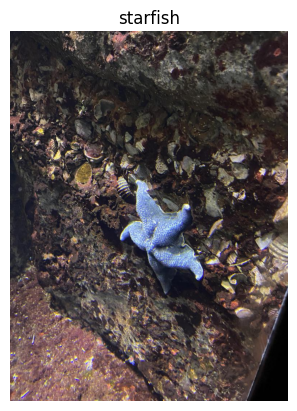

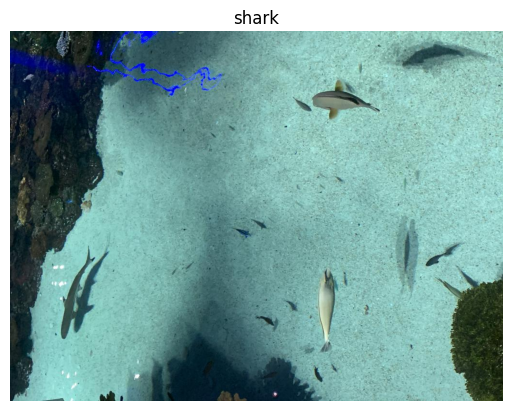

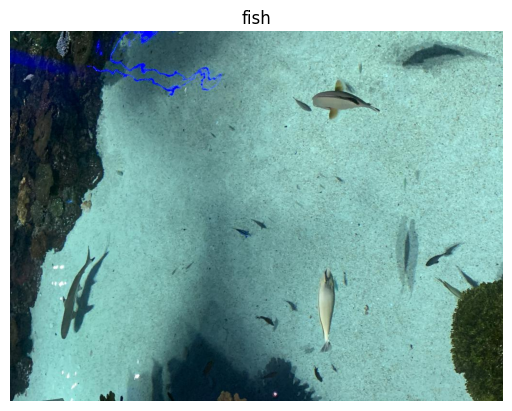

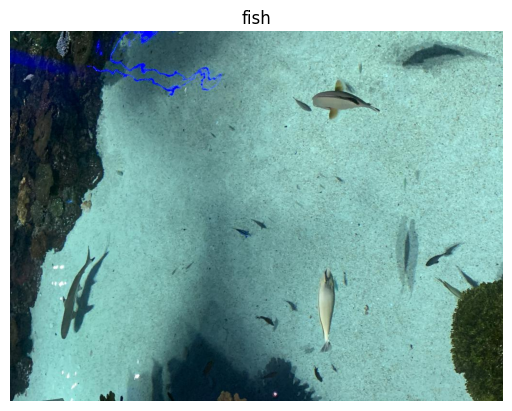

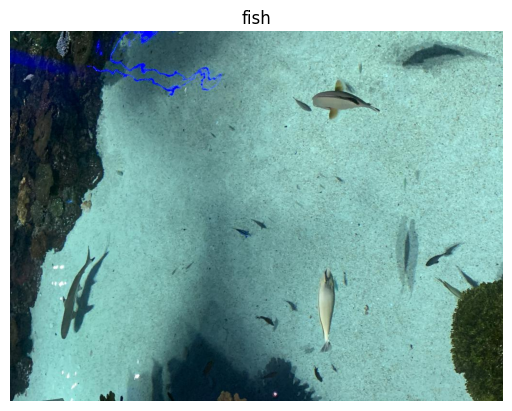

...

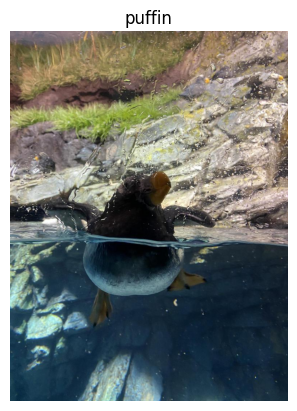

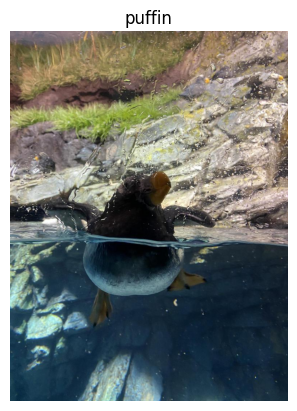

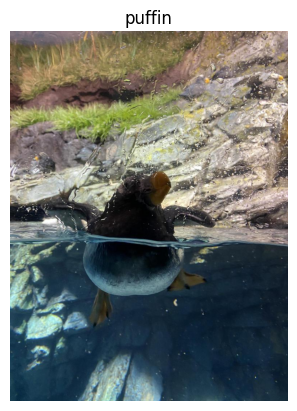

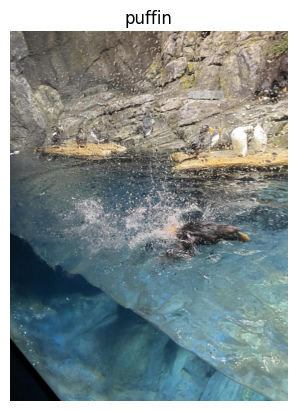

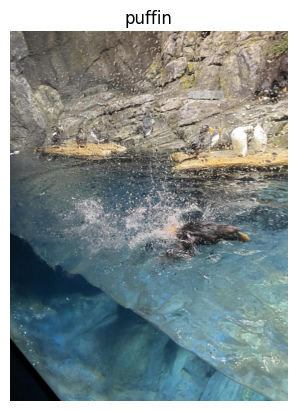

In [ ]:
import matplotlib.pyplot as plt

# Mostrar algunas imágenes del DataFrame
for _, row in df_train.head(20).iterrows():
    plt.imshow(row['imagen'])
    plt.title(row['class'])  # Muestra la etiqueta de la imagen
    plt.axis("off")
    plt.show()


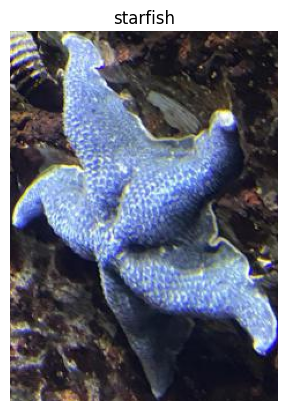

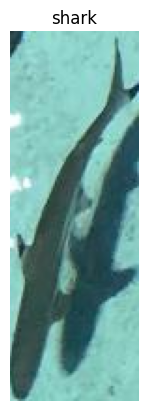

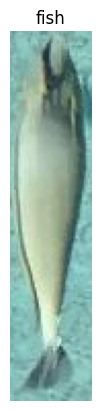

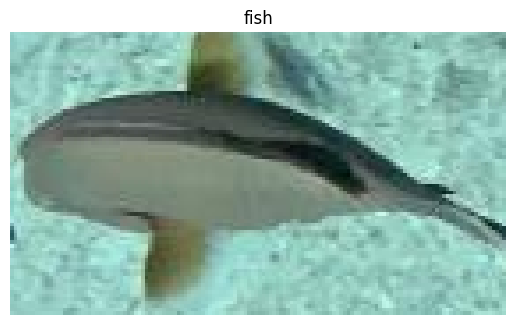

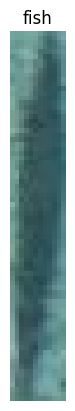

...

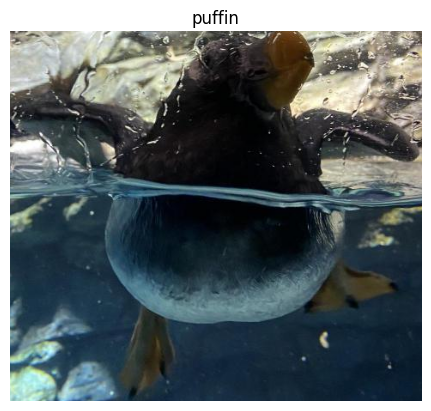

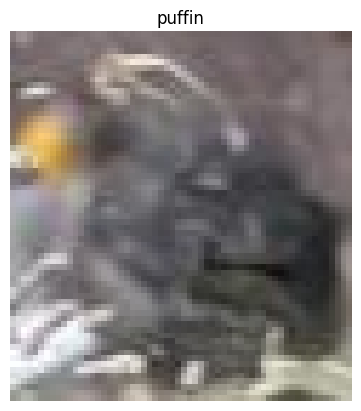

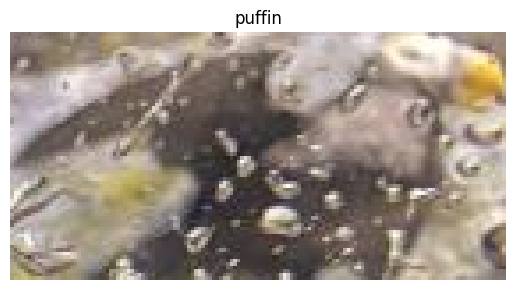

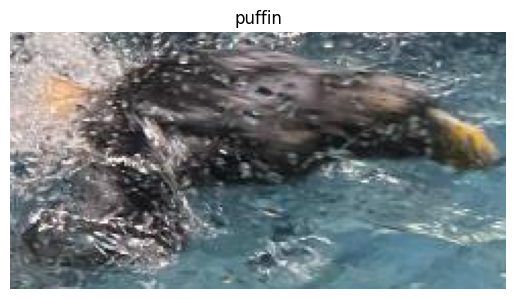

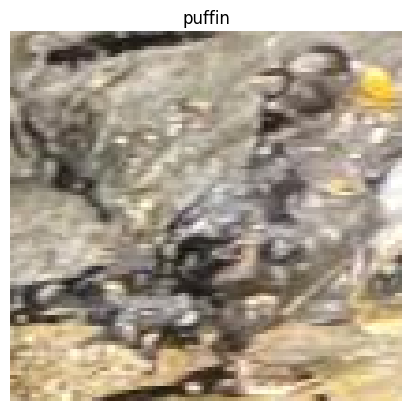

In [32]:
# se quiere transformar df_filtrado de manera que cada registro solo contenga la sección de la imagen delimitada por las coordenadas xmin	ymin	xmax	ymax.

# Crear un nuevo DataFrame para almacenar las imágenes recortadas
df_train_recortado = pd.DataFrame(columns=['filename', 'class', 'xmin', 'ymin', 'xmax', 'ymax', 'imagen_recortada'])

# Iterar sobre las filas del DataFrame filtrado
for index, row in df_train.iterrows():
    imagen = row['imagen']
    if imagen:
        xmin = row['xmin']
        ymin = row['ymin']
        xmax = row['xmax']
        ymax = row['ymax']

        # Recortar la imagen usando las coordenadas
        imagen_recortada = imagen.crop((xmin, ymin, xmax, ymax))

        # Agregar una nueva fila al DataFrame con la imagen recortada
        df_train_recortado = pd.concat([df_train_recortado, pd.DataFrame({'filename': row['filename'],
                                                             'class': row['class'],
                                                             'xmin': xmin,
                                                             'ymin': ymin,
                                                             'xmax': xmax,
                                                             'ymax': ymax,
                                                             'imagen_recortada': [imagen_recortada]})], ignore_index=True)

# Mostrar el nuevo DataFrame con las imágenes recortadas
df_train_recortado.head(20)

# Mostrar algunas imágenes recortadas del DataFrame
for _, row in df_train_recortado.head(20).iterrows():
    plt.imshow(row['imagen_recortada'])
    plt.title(row['class'])  # Muestra la etiqueta de la imagen
    plt.axis("off")
    plt.show()

No es que haya imágenes repetidas, es que hay imágenes con varios animales. No hay registros que sean exactamente iguales.

 A lo mejor sería interesante crear un nuevo data frame en el que se utilizaran los recuadros que contienen a animales individuales, de manera que, en vez de tener 5 registros con la misma foto conteniendo 5 animales, se tuvieran 5 registros con las 5 secciones de la foto original correspondiente a cada uno de los animales.

Ahora vamos a probar a hacer un reetiquetado de las imágenes, de manera que a cada imagen solo le corresponda una etiqueta aunque haya varios animales en ella. Esa primera etiqueta se seleccionará para el animal con la puntuación más alta. Dicha puntuación se calculará de la siguiente manera:

`área de cada uno de los animales en una imagen x 2^numero de veces que aparecen`


In [2]:
# Cargar y preprocesar los datos
# Calcular el área de cada animal
df_train['area'] = (df_train['xmax'] - df_train['xmin']) * (df_train['ymax'] - df_train['ymin'])

# Contar la frecuencia de cada clase en cada imagen
class_counts = df_train.groupby(['filename', 'class']).size().reset_index(name='count')
df_train = df_train.merge(class_counts, on=['filename', 'class'])

# Aplicar la fórmula anterior
df_train['score1'] = df_train['area'] * (2 ** df_train['count'])

# Determinar la nueva etiqueta por imagen
class1 = df_train.loc[df_train.groupby('filename')['score1'].idxmax(), ['filename', 'class']]
class1.rename(columns={'class': 'class1'}, inplace=True)
df_train = df_train.merge(class1, on='filename')

In [3]:
# Función para obtener el animal con mayor 'count' en cada grupo de 'filename'
def calculate_score(group):
    # Seleccionar el registro con mayor valor de 'count'
    max_count_row = group.loc[group['count'].idxmax()]
    return pd.Series({
        'score2': max_count_row['area'] * (2 ** max_count_row['count']),
        'class2': max_count_row['class']
    })

# Agrupar por 'filename' y calcular la columna 'score1'
df_train_grouped = df_train.groupby('filename').apply(calculate_score).reset_index()

# Juntar resultados en el DataFrame original
df_train = df_train.merge(df_train_grouped[['filename', 'score2', 'class2']], on='filename', how='left')


<ipython-input-3-2b8f0aa3a9b0>:6: RuntimeWarning: overflow encountered in scalar multiply
  'score2': max_count_row['area'] * (2 ** max_count_row['count']),
<ipython-input-3-2b8f0aa3a9b0>:6: RuntimeWarning: overflow encountered in scalar multiply
  'score2': max_count_row['area'] * (2 ** max_count_row['count']),
<ipython-input-3-2b8f0aa3a9b0>:6: RuntimeWarning: overflow encountered in scalar multiply
  'score2': max_count_row['area'] * (2 ** max_count_row['count']),
<ipython-input-3-2b8f0aa3a9b0>:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_train_grouped = df_train.groupby('filename').apply(calculate_score).reset_index()


In [4]:
# Función para obtener el animal con mayor 'area' en cada grupo de 'filename'
def calculate_area_score(group):
    # Seleccionar el registro con el mayor valor de 'area'
    max_area_row = group.loc[group['area'].idxmax()]
    return pd.Series({
        'score3': max_area_row['area'],
        'class3': max_area_row['class']  # Etiqueta del animal con mayor área
    })

# Agrupar por 'filename' y calcular la columna 'score3'
df_train_grouped_area = df_train.groupby('filename').apply(calculate_area_score).reset_index()

# Merge de los resultados en el DataFrame original
df_train = df_train.merge(df_train_grouped_area[['filename', 'score3', 'class3']], on='filename', how='left')



<ipython-input-4-b6385064ee24>:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_train_grouped_area = df_train.groupby('filename').apply(calculate_area_score).reset_index()


In [5]:
df_train['score4'] = df_train['area'] * df_train['count']
class4 = df_train.loc[df_train.groupby('filename')['score4'].idxmax(), ['filename', 'class']]
class4.rename(columns={'class': 'class4'}, inplace=True)
df_train = df_train.merge(class4, on='filename')

El nuevo dataframe de entrenamiento tendrá las nuevas etiquetas que se usarán para entrenar a los modelos.

In [6]:
df_train

,filename,width,height,class,xmin,ymin,xmax,ymax,imagen,area,count,score1,class1,score2,class2,score3,class3,score4,class4
0,IMG_2541_jpeg_jpg.rf.fc997b87790e715d47ce1cc83...,768,1024,starfish,302,410,534,730,<PIL.JpegImagePlugin.JpegImageFile image mode=...,74240,1,148480,starfish,148480,starfish,74240,starfish,74240,starfish
1,IMG_8406_jpg.rf.fda4b68f345bda8047e7f15060f70e...,1024,768,shark,106,442,175,640,<PIL.JpegImagePlugin.JpegImageFile image mode=...,13662,1,27324,fish,14909440,fish,13662,shark,13662,fish
2,IMG_8406_jpg.rf.fda4b68f345bda8047e7f15060f70e...,1024,768,fish,638,490,678,672,<PIL.JpegImagePlugin.JpegImageFile image mode=...,7280,11,14909440,fish,14909440,fish,13662,shark,80080,fish
3,IMG_8406_jpg.rf.fda4b68f345bda8047e7f15060f70e...,1024,768,fish,625,107,765,187,<PIL.JpegImagePlugin.JpegImageFile image mode=...,11200,11,22937600,fish,14909440,fish,13662,shark,123200,fish
4,IMG_8406_jpg.rf.fda4b68f345bda8047e7f15060f70e...,1024,768,fish,818,419,830,499,<PIL.JpegImagePlugin.JpegImageFile image mode=...,960,11,1966080,fish,14909440,fish,13662,shark,10560,fish
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3319,IMG_8581_MOV-0_jpg.rf.655f2e11059aeb33350230db...,576,1024,fish,248,414,283,438,<PIL.JpegImagePlugin.JpegImageFile image mode=...,840,10,860160,fish,5511168,fish,20700,stingray,8400,fish
3320,IMG_8581_MOV-0_jpg.rf.655f2e11059aeb33350230db...,576,1024,fish,314,409,333,417,<PIL.JpegImagePlugin.JpegImageFile image mode=...,152,10,155648,fish,5511168,fish,20700,stingray,1520,fish
3321,IMG_8581_MOV-0_jpg.rf.655f2e11059aeb33350230db...,576,1024,stingray,122,343,352,433,<PIL.JpegImagePlugin.JpegImageFile image mode=...,20700,1,41400,fish,5511168,fish,20700,stingray,20700,fish
3322,IMG_8571_MOV-2_jpg.rf.6620ac28d99d209e56813944...,576,1024,fish,499,245,575,361,<PIL.JpegImagePlugin.JpegImageFile image mode=...,8816,1,17632,shark,17632,fish,92571,shark,8816,shark


Eliminamos registros iguales, es decir, los registros que tengan la misma foto, pues a partir de ahora cada foto tiene una única etiqueta en cada clase.

In [7]:
df_train = df_train.drop_duplicates(subset='filename')
df_train.reset_index(drop=True, inplace=True)
df_train

,filename,width,height,class,xmin,ymin,xmax,ymax,imagen,area,count,score1,class1,score2,class2,score3,class3,score4,class4
0,IMG_2541_jpeg_jpg.rf.fc997b87790e715d47ce1cc83...,768,1024,starfish,302,410,534,730,<PIL.JpegImagePlugin.JpegImageFile image mode=...,74240,1,148480,starfish,148480,starfish,74240,starfish,74240,starfish
1,IMG_8406_jpg.rf.fda4b68f345bda8047e7f15060f70e...,1024,768,shark,106,442,175,640,<PIL.JpegImagePlugin.JpegImageFile image mode=...,13662,1,27324,fish,14909440,fish,13662,shark,13662,fish
2,IMG_2383_jpeg_jpg.rf.fd376436d382e985e3c0e6936...,768,1024,starfish,35,504,394,844,<PIL.JpegImagePlugin.JpegImageFile image mode=...,122060,2,488240,starfish,488240,starfish,122060,starfish,244120,starfish
3,IMG_3147_jpeg_jpg.rf.fc4622004ff72e58b54663577...,768,1024,puffin,91,392,571,823,<PIL.JpegImagePlugin.JpegImageFile image mode=...,206880,3,1655040,puffin,1655040,puffin,206880,puffin,620640,puffin
4,IMG_3131_jpeg_jpg.rf.fcf0ccd8dbf187344da242e29...,768,1024,puffin,424,517,667,643,<PIL.JpegImagePlugin.JpegImageFile image mode=...,30618,12,125411328,puffin,125411328,puffin,30618,puffin,367416,puffin
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
442,IMG_2540_jpeg_jpg.rf.648b31d1066b616be81fb9447...,768,1024,starfish,298,323,560,709,<PIL.JpegImagePlugin.JpegImageFile image mode=...,101132,1,202264,starfish,202264,starfish,101132,starfish,101132,starfish
443,IMG_2390_jpeg_jpg.rf.64fe0a0c9bb0459e06335b75d...,768,1024,starfish,135,467,647,810,<PIL.JpegImagePlugin.JpegImageFile image mode=...,175616,1,351232,starfish,351232,starfish,175616,starfish,175616,starfish
444,IMG_2480_jpeg_jpg.rf.65112653d4f14fcd3431eed42...,768,1024,jellyfish,491,185,581,290,<PIL.JpegImagePlugin.JpegImageFile image mode=...,9450,15,309657600,jellyfish,309657600,jellyfish,10500,jellyfish,141750,jellyfish
445,IMG_8581_MOV-0_jpg.rf.655f2e11059aeb33350230db...,576,1024,fish,476,581,545,659,<PIL.JpegImagePlugin.JpegImageFile image mode=...,5382,10,5511168,fish,5511168,fish,20700,stingray,53820,fish


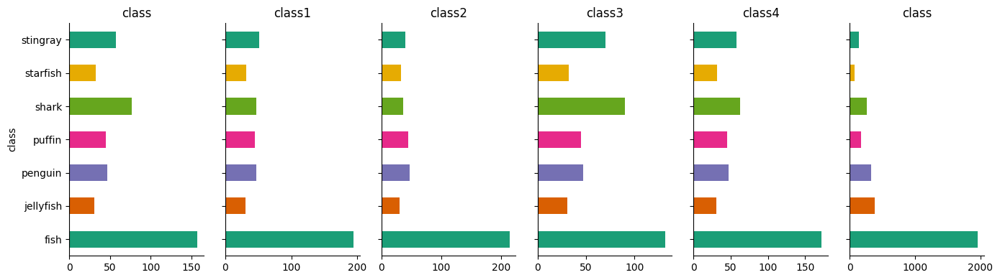

In [39]:
from matplotlib import pyplot as plt
import seaborn as sns

# Configurar el tamaño de la figura
fig, axes = plt.subplots(1, 6, figsize=(14, 4), sharey=True)

# Lista de clases a visualizar y sus DataFrames
class_labels = ['class', 'class1', 'class2', 'class3', 'class4']
dataframes = [df_train] * 5 + [df_train_og]  # Los primeros 5 usan df_train, el último usa df_train_og
titles = class_labels + ['class']

# Colores de la paleta de Seaborn
colors = sns.palettes.mpl_palette('Dark2')

# Graficar cada clase en su respectivo subplot
for i, (label, df) in enumerate(zip(titles, dataframes)):
    df.groupby(label).size().plot(kind='barh', color=colors, ax=axes[i])
    axes[i].set_title(label)
    axes[i].spines[['top', 'right']].set_visible(False)  # Ocultar bordes superiores y derechos

plt.tight_layout()
plt.show()


La primera etiqueta 'class' es la única que no se ha seleccionado en base a ningún criterio, ya que ha sido elegida al eliminar registros cuya foto es igual, quedando como etiqueta la del primer registro.

Vamos a descargar también las bases de datos de validación y test:

In [8]:
!pip install tensorflow

Realizamos data augmentation

In [9]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from PIL import Image
import io

# Supongamos que tu DataFrame se llama 'df_train' (reemplaza esto con tu DataFrame real)
# y que las imágenes están almacenadas como bytes o rutas a archivos.

# Crear un directorio para almacenar las imágenes aumentadas
balanced_data_dir = "dataset_balanceado"
if not os.path.exists(balanced_data_dir):
    os.makedirs(balanced_data_dir)

# Contar las imágenes en cada clase
class_counts = df_train['class'].value_counts()
max_count = class_counts.max()  # Cantidad máxima de imágenes en una clase

# Configuración del Data Augmentation
datagen = ImageDataGenerator(
    rotation_range=20, width_shift_range=0.2, height_shift_range=0.2, shear_range=0.2,
    zoom_range=0.2, horizontal_flip=True, fill_mode='nearest'
)

# Listas para almacenar las nuevas imágenes y sus datos
new_images = []
new_labels = []
new_rows = []

# Función para cargar la imagen desde bytes o ruta
def load_image(img_data):
    if isinstance(img_data, bytes):
        return Image.open(io.BytesIO(img_data))
    elif isinstance(img_data, str):
        return Image.open(img_data)
    else:
        return img_data  # si ya es un objeto PIL.Image

# Aplicar Data Augmentation solo a clases minoritarias
for class_label, count in class_counts.items():
    df_subset = df_train[df_train['class'] == class_label].copy()  # Filtrar imágenes de la clase

    # Asegurar que las imágenes sean objetos PIL antes de redimensionarlas
    df_subset['imagen'] = df_subset['imagen'].apply(load_image)

    images = [np.array(img.resize((64, 64))) / 255.0 for img in df_subset['imagen']]

    num_to_generate = max_count - count
    generated = 0

    for index, row in df_subset.iterrows():
        img = images[index - df_subset.index[0]]  # Asegurarse de que el indice de la imagen corresponda
        img = img.reshape((1,) + img.shape)  # Redimensionar para ImageDataGenerator

        for batch in datagen.flow(img, batch_size=1):
            new_images.append(batch[0])
            new_labels.append(class_label)

            # Convertir el array NumPy de vuelta a PIL.Image
            augmented_image_array = (batch[0] * 255).astype(np.uint8)
            augmented_image = Image.fromarray(augmented_image_array)

            # Crear un nuevo diccionario con los mismos datos del dataset original
            new_row = row.to_dict()
            new_row['imagen'] = augmented_image  # Reemplazar imagen con PIL.Image
            new_rows.append(new_row)

            generated += 1
            if generated >= num_to_generate:
                break
        if generated >= num_to_generate:
            break

# Convertir las nuevas filas en un DataFrame con la misma estructura
df_augmented = pd.DataFrame(new_rows)

# Combinar los datos originales con los aumentados
df_train_balanced = pd.concat([df_train, df_augmented], ignore_index=True).sample(frac=1).reset_index(drop=True)

print(f"Dataset balanceado con {len(df_train_balanced)} imágenes")

# Asegurar que no haya valores nulos
df_train_balanced = df_train_balanced.dropna()

# Ahora df_train_balanced se puede usar en el entrenamiento


Dataset balanceado con 1100 imágenes


In [10]:
df_train_balanced

,filename,width,height,class,xmin,ymin,xmax,ymax,imagen,area,count,score1,class1,score2,class2,score3,class3,score4,class4
0,IMG_3147_jpeg_jpg.rf.fc4622004ff72e58b54663577...,768,1024,puffin,91,392,571,823,<PIL.Image.Image image mode=RGB size=64x64 at ...,206880,3,1655040,puffin,1655040,puffin,206880,puffin,620640,puffin
1,IMG_3148_jpeg_jpg.rf.daef4a62da020f684a31336a1...,768,1024,puffin,0,205,767,860,<PIL.JpegImagePlugin.JpegImageFile image mode=...,502385,3,4019080,puffin,4019080,puffin,502385,puffin,1507155,puffin
2,IMG_2584_jpeg_jpg.rf.fdf498ef5b1b000a6c51d15dc...,768,1024,stingray,0,768,71,875,<PIL.Image.Image image mode=RGB size=64x64 at ...,7597,4,121552,fish,489600,fish,18564,stingray,30388,stingray
3,IMG_2335_jpeg_jpg.rf.fee7aabbe3a95b58fa737bf45...,768,1024,penguin,225,422,295,529,<PIL.Image.Image image mode=RGB size=64x64 at ...,7490,12,30679040,penguin,30679040,penguin,7490,penguin,89880,penguin
4,IMG_2541_jpeg_jpg.rf.fc997b87790e715d47ce1cc83...,768,1024,starfish,302,410,534,730,<PIL.Image.Image image mode=RGB size=64x64 at ...,74240,1,148480,starfish,148480,starfish,74240,starfish,74240,starfish
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,IMG_2541_jpeg_jpg.rf.fc997b87790e715d47ce1cc83...,768,1024,starfish,302,410,534,730,<PIL.Image.Image image mode=RGB size=64x64 at ...,74240,1,148480,starfish,148480,starfish,74240,starfish,74240,starfish
1096,IMG_2541_jpeg_jpg.rf.fc997b87790e715d47ce1cc83...,768,1024,starfish,302,410,534,730,<PIL.Image.Image image mode=RGB size=64x64 at ...,74240,1,148480,starfish,148480,starfish,74240,starfish,74240,starfish
1097,IMG_3147_jpeg_jpg.rf.fc4622004ff72e58b54663577...,768,1024,puffin,91,392,571,823,<PIL.Image.Image image mode=RGB size=64x64 at ...,206880,3,1655040,puffin,1655040,puffin,206880,puffin,620640,puffin
1098,IMG_8496_MOV-5_jpg.rf.eacca955182a03a262de9b2c...,576,1024,fish,0,466,134,642,<PIL.JpegImagePlugin.JpegImageFile image mode=...,23584,3,188672,fish,188672,fish,43188,fish,70752,fish


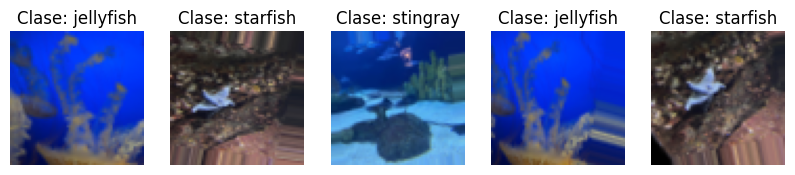

In [84]:
# Seleccionar algunas imágenes aleatorias de las generadas
num_images_to_show = 5  # Número de imágenes que quieres visualizar
indices = np.random.choice(len(new_images), num_images_to_show, replace=False)  # Índices aleatorios

plt.figure(figsize=(10, 5))
for i, idx in enumerate(indices):
    img = new_images[idx]  # Obtener imagen de la lista
    img = (img * 255).astype(np.uint8)  # Desnormalizar (opcional)

    plt.subplot(1, num_images_to_show, i + 1)  # Crear subgráfica
    plt.imshow(img)
    plt.axis("off")  # Ocultar ejes
    plt.title(f"Clase: {new_labels[idx]}")

plt.show()

In [11]:
# Abrir el ZIP sin extraerlo
with zipfile.ZipFile(ruta_zip, 'r') as archivo_zip:
    archivos_en_zip = archivo_zip.namelist()  # Lista de archivos en el ZIP

    # Buscar el archivo annotations.csv dentro de la carpeta valid/
    archivo_annotations = next((f for f in archivos_en_zip if f.startswith("valid/") and "annotations" in f and f.endswith(".csv")), None)

    if archivo_annotations:
        with archivo_zip.open(archivo_annotations) as archivo:
            df_annotations = pd.read_csv(archivo)  # Cargar CSV directamente desde el ZIP
    else:
        raise FileNotFoundError("No se encontró annotations.csv en la carpeta train dentro del ZIP.")

    # Obtener nombres de imágenes en train/
    imagenes_en_valid = {f for f in archivos_en_zip if f.startswith("valid/") and f.endswith((".jpg", ".png"))}

    # Filtrar annotations para incluir solo imágenes que existen en el ZIP
    df_valid = df_annotations[df_annotations['filename'].apply(lambda x: f"valid/{x}" in imagenes_en_valid)].copy()

    # Función para cargar imagen desde el ZIP
    def cargar_imagen(filename):
        ruta_imagen = f"valid/{filename}"
        if ruta_imagen in imagenes_en_valid:
            with archivo_zip.open(ruta_imagen) as imagen_zip:
                return Image.open(io.BytesIO(imagen_zip.read()))  # Cargar imagen con PIL
        return None  # Si no existe, devolver None

    # Crear nueva columna con imágenes
    df_valid['imagen'] = df_valid['filename'].apply(cargar_imagen)

# Mostrar el DataFrame con imágenes
df_valid

,filename,width,height,class,xmin,ymin,xmax,ymax,imagen
0,IMG_2398_jpeg_jpg.rf.000bc0bd92988307264de7019...,768,1024,fish,635,54,767,276,<PIL.JpegImagePlugin.JpegImageFile image mode=...
1,IMG_2398_jpeg_jpg.rf.000bc0bd92988307264de7019...,768,1024,fish,228,479,538,753,<PIL.JpegImagePlugin.JpegImageFile image mode=...
2,IMG_2534_jpeg_jpg.rf.009873a3457c50c740a39d733...,768,1024,fish,126,395,220,576,<PIL.JpegImagePlugin.JpegImageFile image mode=...
3,IMG_2534_jpeg_jpg.rf.009873a3457c50c740a39d733...,768,1024,shark,331,761,767,924,<PIL.JpegImagePlugin.JpegImageFile image mode=...
4,IMG_2534_jpeg_jpg.rf.009873a3457c50c740a39d733...,768,1024,starfish,430,664,602,779,<PIL.JpegImagePlugin.JpegImageFile image mode=...
...,...,...,...,...,...,...,...,...,...
904,IMG_2522_jpeg_jpg.rf.fe97228c0f9f15d425a80236b...,768,1024,puffin,557,569,596,611,<PIL.JpegImagePlugin.JpegImageFile image mode=...
905,IMG_2522_jpeg_jpg.rf.fe97228c0f9f15d425a80236b...,768,1024,puffin,439,568,490,606,<PIL.JpegImagePlugin.JpegImageFile image mode=...
906,IMG_2522_jpeg_jpg.rf.fe97228c0f9f15d425a80236b...,768,1024,puffin,140,557,203,588,<PIL.JpegImagePlugin.JpegImageFile image mode=...
907,IMG_2522_jpeg_jpg.rf.fe97228c0f9f15d425a80236b...,768,1024,puffin,305,389,357,420,<PIL.JpegImagePlugin.JpegImageFile image mode=...


Realizamos el mismo proceso de reetiquetado con los datos de validación.

In [12]:
# Cargar y preprocesar los datos en df_valid
# Calcular el área de cada animal
df_valid['area'] = (df_valid['xmax'] - df_valid['xmin']) * (df_valid['ymax'] - df_valid['ymin'])

# Contar la frecuencia de cada clase en cada imagen
class_counts_valid = df_valid.groupby(['filename', 'class']).size().reset_index(name='count')
df_valid = df_valid.merge(class_counts_valid, on=['filename', 'class'])

# Aplicar la fórmula anterior
df_valid['score1'] = df_valid['area'] * (2 ** df_valid['count'])

# Determinar la nueva etiqueta por imagen
class1_valid = df_valid.loc[df_valid.groupby('filename')['score1'].idxmax(), ['filename', 'class']]
class1_valid.rename(columns={'class': 'class1'}, inplace=True)
df_valid = df_valid.merge(class1_valid, on='filename')

# Función para obtener el animal con mayor 'count' en cada grupo de 'filename'
def calculate_score_valid(group):
    # Seleccionar el registro con mayor valor de 'count'
    max_count_row = group.loc[group['count'].idxmax()]
    return pd.Series({
        'score2': max_count_row['area'] * (2 ** max_count_row['count']),
        'class2': max_count_row['class']
    })

# Agrupar por 'filename' y calcular la columna 'score2'
df_valid_grouped = df_valid.groupby('filename').apply(calculate_score_valid).reset_index()

# Merge de los resultados en el DataFrame original
df_valid = df_valid.merge(df_valid_grouped[['filename', 'score2', 'class2']], on='filename', how='left')

# Función para obtener el animal con mayor 'area' en cada grupo de 'filename'
def calculate_area_score_valid(group):
    # Seleccionar el registro con el mayor valor de 'area'
    max_area_row = group.loc[group['area'].idxmax()]
    return pd.Series({
        'score3': max_area_row['area'],
        'class3': max_area_row['class']  # Etiqueta del animal con mayor área
    })

# Agrupar por 'filename' y calcular la columna 'score3'
df_valid_grouped_area = df_valid.groupby('filename').apply(calculate_area_score_valid).reset_index()

# Merge de los resultados en el DataFrame original
df_valid = df_valid.merge(df_valid_grouped_area[['filename', 'score3', 'class3']], on='filename', how='left')

# Calcular score4 y determinar class4
df_valid['score4'] = df_valid['area'] * df_valid['count']
class4_valid = df_valid.loc[df_valid.groupby('filename')['score4'].idxmax(), ['filename', 'class']]
class4_valid.rename(columns={'class': 'class4'}, inplace=True)
df_valid = df_valid.merge(class4_valid, on='filename')


<ipython-input-12-9bc6c73e2c8a>:27: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_valid_grouped = df_valid.groupby('filename').apply(calculate_score_valid).reset_index()
<ipython-input-12-9bc6c73e2c8a>:42: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_valid_grouped_area = df_valid.groupby('filename').apply(calculate_area_score_valid).reset_index()


Eliminamos duplicados de nuevo

In [14]:
df_valid = df_valid.drop_duplicates(subset='filename')
df_valid.reset_index(drop=True, inplace=True)
df_valid

,filename,width,height,class,xmin,ymin,xmax,ymax,imagen,area,count,score1,class1,score2,class2,score3,class3,score4,class4
0,IMG_2398_jpeg_jpg.rf.000bc0bd92988307264de7019...,768,1024,fish,635,54,767,276,<PIL.JpegImagePlugin.JpegImageFile image mode=...,29304,2,117216,fish,117216,fish,84940,fish,58608,fish
1,IMG_2534_jpeg_jpg.rf.009873a3457c50c740a39d733...,768,1024,fish,126,395,220,576,<PIL.JpegImagePlugin.JpegImageFile image mode=...,17014,1,34028,shark,79120,starfish,71068,shark,17014,shark
2,IMG_2464_jpeg_jpg.rf.0121fe35073ca26afded76a7a...,768,1024,jellyfish,457,0,644,168,<PIL.JpegImagePlugin.JpegImageFile image mode=...,31416,22,131768254464,jellyfish,131768254464,jellyfish,31416,jellyfish,691152,jellyfish
3,IMG_2323_jpeg_jpg.rf.035c5370cfa9efce40a515ce4...,768,1024,penguin,219,354,572,486,<PIL.JpegImagePlugin.JpegImageFile image mode=...,46596,3,372768,penguin,372768,penguin,46596,penguin,139788,penguin
4,IMG_3120_jpeg_jpg.rf.05e302318ebf9502b3467828b...,768,1024,starfish,138,316,529,680,<PIL.JpegImagePlugin.JpegImageFile image mode=...,142324,1,284648,starfish,284648,starfish,142324,starfish,142324,starfish
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122,IMG_2637_jpeg_jpg.rf.fb8a2e97a480a468812b0217a...,768,1024,stingray,200,454,674,830,<PIL.JpegImagePlugin.JpegImageFile image mode=...,178224,2,712896,stingray,712896,stingray,178224,stingray,356448,stingray
123,IMG_2381_jpeg_jpg.rf.fc0d53c3b03994926fe019493...,768,1024,starfish,200,427,564,783,<PIL.JpegImagePlugin.JpegImageFile image mode=...,129584,1,259168,starfish,259168,starfish,129584,starfish,129584,starfish
124,IMG_2469_jpeg_jpg.rf.fca5db81cde8b6fe73b8f150e...,768,1024,jellyfish,420,9,610,236,<PIL.JpegImagePlugin.JpegImageFile image mode=...,43130,20,45225082880,jellyfish,45225082880,jellyfish,43130,jellyfish,862600,jellyfish
125,IMG_8535_MOV-5_jpg.rf.fe45012859267d87836726ec...,1024,576,puffin,463,374,560,492,<PIL.JpegImagePlugin.JpegImageFile image mode=...,11446,5,366272,puffin,366272,puffin,18824,puffin,57230,puffin


Vamos a hacer data augmentation en el conjunto de validación también

In [15]:

# Crear un directorio para almacenar las imágenes aumentadas (opcional, si quieres guardar las imágenes)
balanced_valid_dir = "dataset_valid_balanceado"
if not os.path.exists(balanced_valid_dir):
    os.makedirs(balanced_valid_dir)

# Contar las imágenes en cada clase
class_counts_valid = df_valid['class'].value_counts()
max_count_valid = class_counts_valid.max()  # Cantidad máxima de imágenes en una clase

# Configuración del Data Augmentation
datagen = ImageDataGenerator(
    rotation_range=20, width_shift_range=0.2, height_shift_range=0.2, shear_range=0.2,
    zoom_range=0.2, horizontal_flip=True, fill_mode='nearest'
)

# Listas para almacenar las nuevas imágenes y sus datos
new_valid_images = []
new_valid_labels = []
new_valid_rows = []

# Función para cargar la imagen desde bytes o ruta
def load_image(img_data):
    if isinstance(img_data, bytes):
        return Image.open(io.BytesIO(img_data))
    elif isinstance(img_data, str):
        return Image.open(img_data)
    else:
        return img_data  # si ya es un objeto PIL.Image

# Aplicar Data Augmentation solo a clases minoritarias
for class_label, count in class_counts_valid.items():
    df_subset_valid = df_valid[df_valid['class'] == class_label].copy()  # Filtrar imágenes de la clase

    # Asegurar que las imágenes sean objetos PIL antes de redimensionarlas
    df_subset_valid['imagen'] = df_subset_valid['imagen'].apply(load_image)

    images_valid = [np.array(img.resize((64, 64))) / 255.0 for img in df_subset_valid['imagen']]

    num_to_generate_valid = max_count_valid - count
    generated_valid = 0

    for index, row in df_subset_valid.iterrows():
        img_valid = images_valid[index - df_subset_valid.index[0]]  # Asegurarse de que el indice de la imagen corresponda
        img_valid = img_valid.reshape((1,) + img_valid.shape)  # Redimensionar para ImageDataGenerator

        for batch in datagen.flow(img_valid, batch_size=1):
            new_valid_images.append(batch[0])
            new_valid_labels.append(class_label)

            # Convertir el array NumPy de vuelta a PIL.Image
            augmented_image_array = (batch[0] * 255).astype(np.uint8)
            augmented_image = Image.fromarray(augmented_image_array)

            # Crear un nuevo diccionario con los mismos datos del dataset original
            new_row_valid = row.to_dict()
            new_row_valid['imagen'] = augmented_image  # Reemplazar imagen con PIL.Image
            new_valid_rows.append(new_row_valid)

            generated_valid += 1
            if generated_valid >= num_to_generate_valid:
                break
        if generated_valid >= num_to_generate_valid:
            break

# Convertir las nuevas filas en un DataFrame con la misma estructura
df_augmented_valid = pd.DataFrame(new_valid_rows)

# Combinar los datos originales con los aumentados
df_valid_balanced = pd.concat([df_valid, df_augmented_valid], ignore_index=True).sample(frac=1).reset_index(drop=True)

print(f"Dataset de validación balanceado con {len(df_valid_balanced)} imágenes")

# Asegurar que no haya valores nulos
df_valid_balanced = df_valid_balanced.dropna()

# Ahora df_valid_balanced se puede usar en la validación


Dataset de validación balanceado con 330 imágenes


In [16]:
df_valid_balanced

,filename,width,height,class,xmin,ymin,xmax,ymax,imagen,area,count,score1,class1,score2,class2,score3,class3,score4,class4
0,IMG_2464_jpeg_jpg.rf.0121fe35073ca26afded76a7a...,768,1024,jellyfish,457,0,644,168,<PIL.Image.Image image mode=RGB size=64x64 at ...,31416,22,131768254464,jellyfish,131768254464,jellyfish,31416,jellyfish,691152,jellyfish
1,IMG_3139_jpeg_jpg.rf.0de4ff0e2cd3d35f89fc00152...,768,1024,puffin,414,237,498,311,<PIL.Image.Image image mode=RGB size=64x64 at ...,6216,3,49728,puffin,49728,puffin,6216,puffin,18648,puffin
2,IMG_2323_jpeg_jpg.rf.035c5370cfa9efce40a515ce4...,768,1024,penguin,219,354,572,486,<PIL.Image.Image image mode=RGB size=64x64 at ...,46596,3,372768,penguin,372768,penguin,46596,penguin,139788,penguin
3,IMG_2569_jpeg_jpg.rf.3eae12557d50da95ba481a576...,768,1024,stingray,241,510,547,653,<PIL.JpegImagePlugin.JpegImageFile image mode=...,43758,1,87516,fish,3604480,fish,43758,stingray,43758,fish
4,IMG_3120_jpeg_jpg.rf.05e302318ebf9502b3467828b...,768,1024,starfish,138,316,529,680,<PIL.Image.Image image mode=RGB size=64x64 at ...,142324,1,284648,starfish,284648,starfish,142324,starfish,142324,starfish
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
325,IMG_2277_jpeg_jpg.rf.86c72d6192da48d941ffa957f...,768,1024,fish,416,272,472,532,<PIL.JpegImagePlugin.JpegImageFile image mode=...,14560,16,954204160,fish,954204160,fish,51275,fish,232960,fish
326,IMG_2464_jpeg_jpg.rf.0121fe35073ca26afded76a7a...,768,1024,jellyfish,457,0,644,168,<PIL.Image.Image image mode=RGB size=64x64 at ...,31416,22,131768254464,jellyfish,131768254464,jellyfish,31416,jellyfish,691152,jellyfish
327,IMG_2323_jpeg_jpg.rf.035c5370cfa9efce40a515ce4...,768,1024,penguin,219,354,572,486,<PIL.Image.Image image mode=RGB size=64x64 at ...,46596,3,372768,penguin,372768,penguin,46596,penguin,139788,penguin
328,IMG_8465_jpg.rf.4e9f92133e269119a82e502339b798...,1024,768,fish,829,528,879,632,<PIL.JpegImagePlugin.JpegImageFile image mode=...,5200,18,1363148800,fish,1363148800,fish,7954,fish,93600,fish


In [24]:
# Abrir el ZIP sin extraerlo
with zipfile.ZipFile(ruta_zip, 'r') as archivo_zip:
    archivos_en_zip = archivo_zip.namelist()  # Lista de archivos en el ZIP

    # Buscar el archivo annotations.csv dentro de la carpeta test/
    archivo_annotations = next((f for f in archivos_en_zip if f.startswith("test/") and "annotations" in f and f.endswith(".csv")), None)

    if archivo_annotations:
        with archivo_zip.open(archivo_annotations) as archivo:
            df_annotations = pd.read_csv(archivo)  # Cargar CSV directamente desde el ZIP
    else:
        raise FileNotFoundError("No se encontró annotations.csv en la carpeta test dentro del ZIP.")

    # Obtener nombres de imágenes en train/
    imagenes_en_test = {f for f in archivos_en_zip if f.startswith("test/") and f.endswith((".jpg", ".png"))}

    # Filtrar annotations para incluir solo imágenes que existen en el ZIP
    df_test = df_annotations[df_annotations['filename'].apply(lambda x: f"test/{x}" in imagenes_en_test)].copy()

    # Función para cargar imagen desde el ZIP
    def cargar_imagen(filename):
        ruta_imagen = f"test/{filename}"
        if ruta_imagen in imagenes_en_test:
            with archivo_zip.open(ruta_imagen) as imagen_zip:
                return Image.open(io.BytesIO(imagen_zip.read()))  # Cargar imagen con PIL
        return None  # Si no existe, devolver None

    # Crear nueva columna con imágenes
    df_test['imagen'] = df_test['filename'].apply(cargar_imagen)

# Mostrar el DataFrame con imágenes
df_test

,filename,width,height,class,xmin,ymin,xmax,ymax,imagen
0,IMG_2526_jpeg_jpg.rf.003e1d1d41bcd204df731b85c...,768,1024,puffin,406,457,497,533,<PIL.JpegImagePlugin.JpegImageFile image mode=...
1,IMG_2526_jpeg_jpg.rf.003e1d1d41bcd204df731b85c...,768,1024,puffin,18,705,82,759,<PIL.JpegImagePlugin.JpegImageFile image mode=...
2,IMG_2526_jpeg_jpg.rf.003e1d1d41bcd204df731b85c...,768,1024,puffin,51,426,116,475,<PIL.JpegImagePlugin.JpegImageFile image mode=...
3,IMG_2526_jpeg_jpg.rf.003e1d1d41bcd204df731b85c...,768,1024,puffin,428,331,504,376,<PIL.JpegImagePlugin.JpegImageFile image mode=...
4,IMG_2526_jpeg_jpg.rf.003e1d1d41bcd204df731b85c...,768,1024,puffin,0,613,21,658,<PIL.JpegImagePlugin.JpegImageFile image mode=...
...,...,...,...,...,...,...,...,...,...
579,IMG_2450_jpeg_jpg.rf.ff673921373de3bfc275863e3...,768,1024,fish,0,253,32,296,<PIL.JpegImagePlugin.JpegImageFile image mode=...
580,IMG_2450_jpeg_jpg.rf.ff673921373de3bfc275863e3...,768,1024,fish,368,284,484,327,<PIL.JpegImagePlugin.JpegImageFile image mode=...
581,IMG_2450_jpeg_jpg.rf.ff673921373de3bfc275863e3...,768,1024,fish,685,257,768,299,<PIL.JpegImagePlugin.JpegImageFile image mode=...
582,IMG_2450_jpeg_jpg.rf.ff673921373de3bfc275863e3...,768,1024,fish,638,312,734,357,<PIL.JpegImagePlugin.JpegImageFile image mode=...


Vamos a probar un modelo básico con diferentes datos de entrenamiento:



1.   Reetiquetado 1: puntuación1 = área del bounding box que contiene al animal x 2^nº de veces que aparece ese tipo de animal en la imagen. El tipo de animal con mayor puntuación será elegido como nueva etiqueta.
2.   Reetiquetado 2: el tipo de animal que más veces aparezca en la foto sera elegido como nueva etiqueta.
3.   Reetiquetado 3: el tipo de animal que más área tenga en la foto sera elegido como nueva etiqueta.
4.  Reetiquetado 4: puntuación4 = área del bounding box que contiene al animal x nº de veces que aparece ese tipo de animal en la imagen.



Se va a entrenar cada configuración con cada una de las 4 etiquetas nuevas, de manera que se entrenará el modelo 12 veces, y se elegirá la etiqueta que mejor parezca funcionar.

In [19]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

Empezamos probando con los datos tras el reetiquetado pero sin aumentar:

Evaluando configuración: {'kernel_sizes': [(3, 3), (3, 3), (3, 3)], 'pool_sizes': [(2, 2), (2, 2), (2, 2)], 'learning_rate': 0.001}
Usando la etiqueta: class1


<ipython-input-41-c75a7387417b>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train['new_label'] = df_train[class_col]
<ipython-input-41-c75a7387417b>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_valid['new_label'] = df_valid[class_col]
<ipython-input-41-c75a7387417b>:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

Epoch 1/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 664ms/step - accuracy: 0.2385 - loss: 2.1199 - val_accuracy: 0.3937 - val_loss: 1.8228
Epoch 2/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 518ms/step - accuracy: 0.4398 - loss: 1.7282 - val_accuracy: 0.4488 - val_loss: 1.6857
Epoch 3/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 485ms/step - accuracy: 0.4336 - loss: 1.5762 - val_accuracy: 0.4331 - val_loss: 1.6058
Epoch 4/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 518ms/step - accuracy: 0.4249 - loss: 1.4897 - val_accuracy: 0.4252 - val_loss: 1.5350
Epoch 5/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 483ms/step - accuracy: 0.4358 - loss: 1.4231 - val_accuracy: 0.4094 - val_loss: 1.5247
Epoch 6/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 468ms/step - accuracy: 0.4488 - loss: 1.3802 - val_accuracy: 0.3622 - val_loss: 1.5559
Epoch 7/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 451ms/step - accuracy: 0.4603 - loss: 1.3578 - val_accuracy: 0.4173 - val_loss: 1.3709
Epoch 8/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 468ms/step - accuracy: 0.5277 - loss: 1.2278 - val_accuracy: 0.4961 - val_loss:

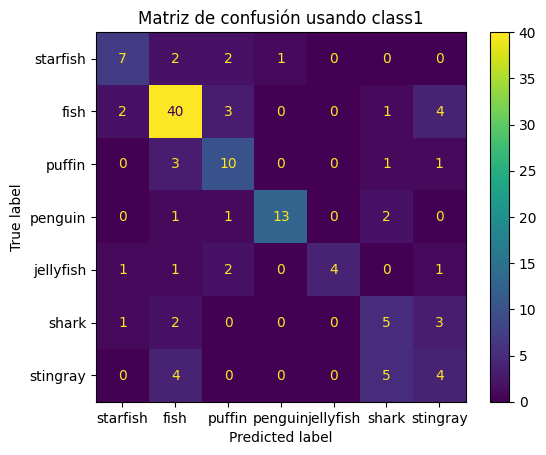

Usando la etiqueta: class2
Epoch 1/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 568ms/step - accuracy: 0.2644 - loss: 1.8964 - val_accuracy: 0.4094 - val_loss: 1.7487
Epoch 2/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 469ms/step - accuracy: 0.4395 - loss: 1.6890 - val_accuracy: 0.4094 - val_loss: 1.6510
Epoch 3/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 436ms/step - accuracy: 0.4669 - loss: 1.5222 - val_accuracy: 0.3701 - val_loss: 1.5907
Epoch 4/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 453ms/step - accuracy: 0.4672 - loss: 1.4297 - val_accuracy: 0.3543 - val_loss: 1.6180
Epoch 5/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 451ms/step - accuracy: 0.4880 - loss: 1.4376 - val_accuracy: 0.4016 - val_loss: 1.5120
Epoch 6/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 454ms/step - accuracy: 0.5404 - loss: 1.3167 - val_accuracy: 0.3937 - val_loss: 1.5207
Epoch 7/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 452ms/step - accuracy: 0.5045 - loss: 1.3023 - val_accuracy: 0.4646 - val_loss: 1.4218
Epoch 8/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 503ms/step - accuracy: 0.5646 - loss: 1.2072 - val_a

3/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


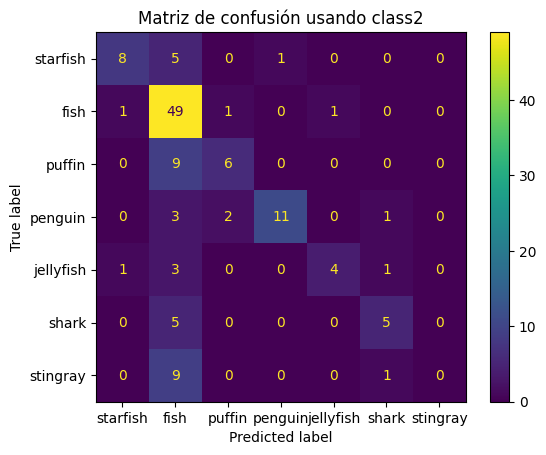

Usando la etiqueta: class3
Epoch 1/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 503ms/step - accuracy: 0.1852 - loss: 1.9276 - val_accuracy: 0.3150 - val_loss: 1.8568
Epoch 2/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 485ms/step - accuracy: 0.3067 - loss: 1.7840 - val_accuracy: 0.4252 - val_loss: 1.6801
Epoch 3/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 470ms/step - accuracy: 0.3958 - loss: 1.6442 - val_accuracy: 0.4724 - val_loss: 1.5469
Epoch 4/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 480ms/step - accuracy: 0.4348 - loss: 1.4628 - val_accuracy: 0.2992 - val_loss: 1.6589
Epoch 5/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 486ms/step - accuracy: 0.4661 - loss: 1.3976 - val_accuracy: 0.3307 - val_loss: 1.4784
Epoch 6/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 468ms/step - accuracy: 0.4246 - loss: 1.3584 - val_accuracy: 0.3386 - val_loss: 1.5738
Epoch 7/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 501ms/step - accuracy: 0.4959 - loss: 1.2812 - val_accuracy: 0.3622 - val_loss: 1.3721
Epoch 8/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 449ms/step - accuracy: 0.5227 - loss: 1.1704 - val_a

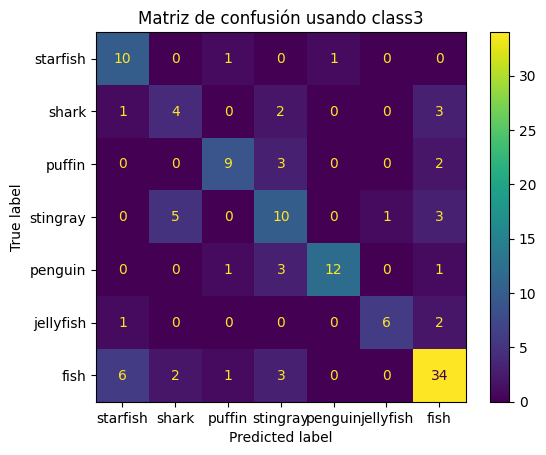

Usando la etiqueta: class4
Epoch 1/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 534ms/step - accuracy: 0.2571 - loss: 1.9166 - val_accuracy: 0.3858 - val_loss: 1.7576
Epoch 2/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 519ms/step - accuracy: 0.4417 - loss: 1.6333 - val_accuracy: 0.3071 - val_loss: 1.6544
Epoch 3/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 485ms/step - accuracy: 0.3674 - loss: 1.5354 - val_accuracy: 0.4252 - val_loss: 1.5189
Epoch 4/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 486ms/step - accuracy: 0.4803 - loss: 1.3737 - val_accuracy: 0.3780 - val_loss: 1.4692
Epoch 5/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 468ms/step - accuracy: 0.4780 - loss: 1.3490 - val_accuracy: 0.3701 - val_loss: 1.4891
Epoch 6/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 434ms/step - accuracy: 0.5036 - loss: 1.2754 - val_accuracy: 0.4567 - val_loss: 1.4180
Epoch 7/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 467ms/step - accuracy: 0.5358 - loss: 1.1816 - val_accuracy: 0.4409 - val_loss: 1.4448
Epoch 8/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 467ms/step - accuracy: 0.5188 - loss: 1.2077 - val_a

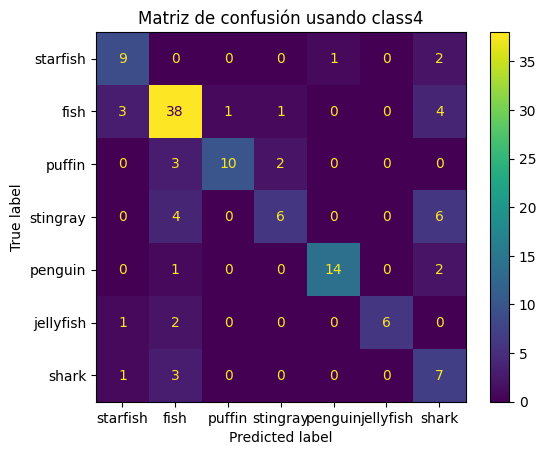

Evaluando configuración: {'kernel_sizes': [(5, 5), (3, 3), (3, 3)], 'pool_sizes': [(3, 3), (2, 2), (2, 2)], 'learning_rate': 0.0005}
Usando la etiqueta: class1
Epoch 1/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 434ms/step - accuracy: 0.3222 - loss: 1.8848 - val_accuracy: 0.3937 - val_loss: 1.7734
Epoch 2/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 384ms/step - accuracy: 0.4451 - loss: 1.7038 - val_accuracy: 0.3937 - val_loss: 1.7579
Epoch 3/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 370ms/step - accuracy: 0.4451 - loss: 1.6776 - val_accuracy: 0.3937 - val_loss: 1.7209
Epoch 4/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 337ms/step - accuracy: 0.4451 - loss: 1.6219 - val_accuracy: 0.4646 - val_loss: 1.6624
Epoch 5/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 336ms/step - accuracy: 0.4693 - loss: 1.5419 - val_accuracy: 0.4409 - val_loss: 1.5816
Epoch 6/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 384ms/step - accuracy: 0.4739 - loss: 1.4610 - val_accuracy: 0.4016 - val_loss: 1.5271
Epoch 7/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 336ms/step - accuracy: 0.4898 - loss: 1.3879 

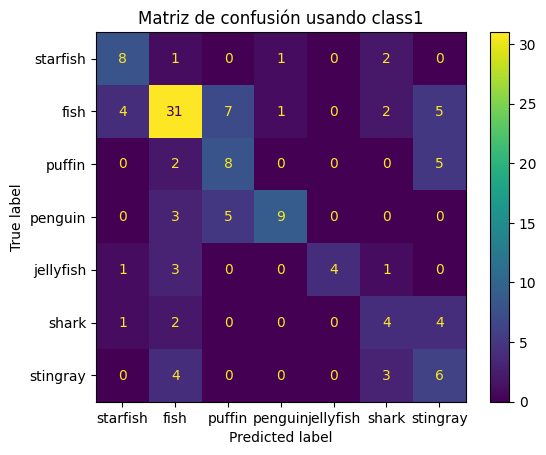

Usando la etiqueta: class2
Epoch 1/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 502ms/step - accuracy: 0.3571 - loss: 1.8307 - val_accuracy: 0.4094 - val_loss: 1.7116
Epoch 2/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 384ms/step - accuracy: 0.4800 - loss: 1.6116 - val_accuracy: 0.4094 - val_loss: 1.6920
Epoch 3/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 384ms/step - accuracy: 0.4800 - loss: 1.5472 - val_accuracy: 0.4646 - val_loss: 1.5472
Epoch 4/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 351ms/step - accuracy: 0.5002 - loss: 1.4150 - val_accuracy: 0.4646 - val_loss: 1.4682
Epoch 5/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 367ms/step - accuracy: 0.5391 - loss: 1.3077 - val_accuracy: 0.4252 - val_loss: 1.4400
Epoch 6/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 352ms/step - accuracy: 0.5608 - loss: 1.2619 - val_accuracy: 0.4724 - val_loss: 1.3763
Epoch 7/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 350ms/step - accuracy: 0.5657 - loss: 1.1821 - val_accuracy: 0.4252 - val_loss: 1.4419
Epoch 8/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 352ms/step - accuracy: 0.5329 - loss: 1.2312 - val_a

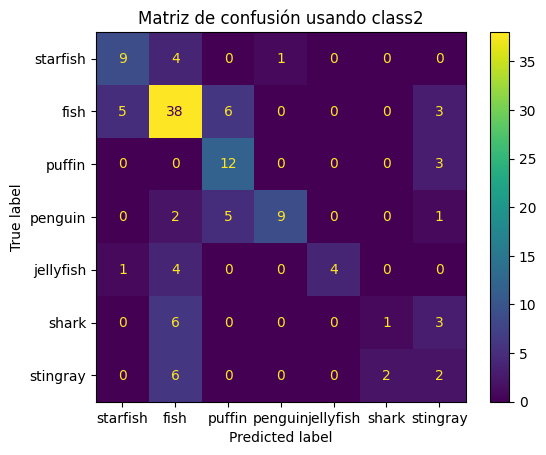

Usando la etiqueta: class3
Epoch 1/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 436ms/step - accuracy: 0.2666 - loss: 1.9284 - val_accuracy: 0.3622 - val_loss: 1.8484
Epoch 2/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 385ms/step - accuracy: 0.3166 - loss: 1.8097 - val_accuracy: 0.1024 - val_loss: 1.8399
Epoch 3/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 352ms/step - accuracy: 0.3077 - loss: 1.7363 - val_accuracy: 0.3386 - val_loss: 1.6870
Epoch 4/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 351ms/step - accuracy: 0.4071 - loss: 1.5884 - val_accuracy: 0.2677 - val_loss: 1.6665
Epoch 5/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 349ms/step - accuracy: 0.3791 - loss: 1.5452 - val_accuracy: 0.1654 - val_loss: 1.8821
Epoch 6/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 334ms/step - accuracy: 0.4384 - loss: 1.4874 - val_accuracy: 0.2677 - val_loss: 1.7566
Epoch 7/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 334ms/step - accuracy: 0.4821 - loss: 1.4223 - val_accuracy: 0.2126 - val_loss: 1.7078
Epoch 8/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 385ms/step - accuracy: 0.4716 - loss: 1.3632 - val_a

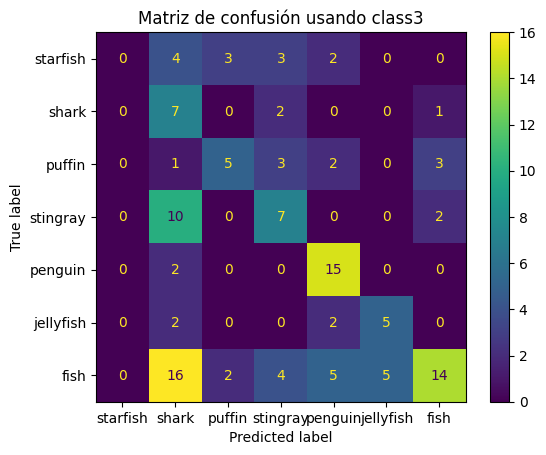

Usando la etiqueta: class4
Epoch 1/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 436ms/step - accuracy: 0.3076 - loss: 1.8422 - val_accuracy: 0.3701 - val_loss: 1.7633
Epoch 2/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 401ms/step - accuracy: 0.3878 - loss: 1.7257 - val_accuracy: 0.3780 - val_loss: 1.6803
Epoch 3/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 403ms/step - accuracy: 0.3683 - loss: 1.6208 - val_accuracy: 0.3465 - val_loss: 1.6322
Epoch 4/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 367ms/step - accuracy: 0.4136 - loss: 1.5363 - val_accuracy: 0.4094 - val_loss: 1.5702
Epoch 5/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 369ms/step - accuracy: 0.4806 - loss: 1.4444 - val_accuracy: 0.4016 - val_loss: 1.5248
Epoch 6/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 350ms/step - accuracy: 0.4930 - loss: 1.3790 - val_accuracy: 0.4252 - val_loss: 1.4915
Epoch 7/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 335ms/step - accuracy: 0.5120 - loss: 1.3264 - val_accuracy: 0.4094 - val_loss: 1.4754
Epoch 8/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 351ms/step - accuracy: 0.5259 - loss: 1.2762 - val_a

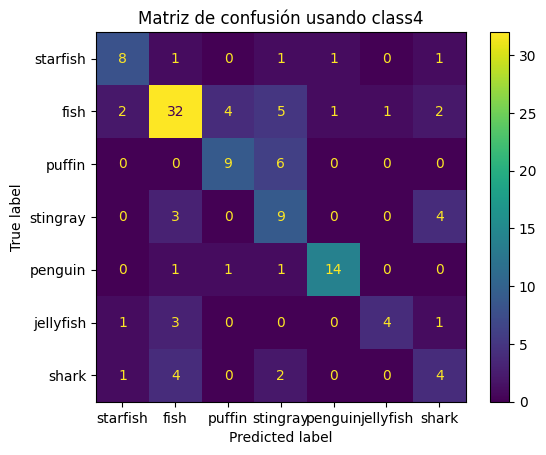

Evaluando configuración: {'kernel_sizes': [(3, 3), (5, 5), (3, 3)], 'pool_sizes': [(2, 2), (3, 3), (2, 2)], 'learning_rate': 0.0001}
Usando la etiqueta: class1
Epoch 1/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 602ms/step - accuracy: 0.2965 - loss: 1.9025 - val_accuracy: 0.3937 - val_loss: 1.7795
Epoch 2/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 519ms/step - accuracy: 0.4451 - loss: 1.7062 - val_accuracy: 0.3937 - val_loss: 1.7346
Epoch 3/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 535ms/step - accuracy: 0.4451 - loss: 1.6525 - val_accuracy: 0.3937 - val_loss: 1.6963
Epoch 4/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 552ms/step - accuracy: 0.4451 - loss: 1.6093 - val_accuracy: 0.3937 - val_loss: 1.6563
Epoch 5/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 519ms/step - accuracy: 0.4451 - loss: 1.5656 - val_accuracy: 0.3937 - val_loss: 1.6164
Epoch 6/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 535ms/step - accuracy: 0.4451 - loss: 1.5222 - val_accuracy: 0.4094 - val_loss: 1.5776
Epoch 7/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 516ms/step - accuracy: 0.4606 - loss: 1.4817 

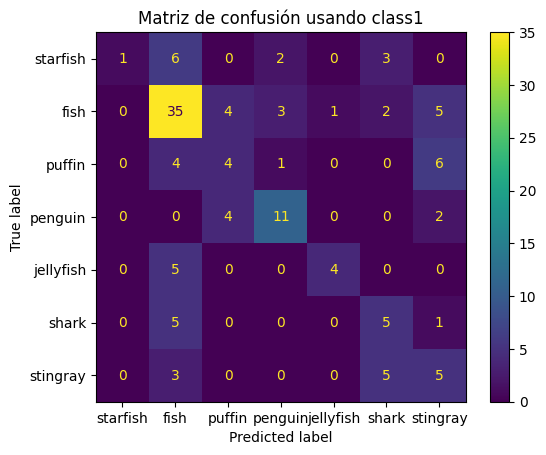

Usando la etiqueta: class2
Epoch 1/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 585ms/step - accuracy: 0.4159 - loss: 1.8008 - val_accuracy: 0.4094 - val_loss: 1.7282
Epoch 2/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 535ms/step - accuracy: 0.4800 - loss: 1.6262 - val_accuracy: 0.4094 - val_loss: 1.6997
Epoch 3/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 532ms/step - accuracy: 0.4800 - loss: 1.5882 - val_accuracy: 0.4094 - val_loss: 1.6640
Epoch 4/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 553ms/step - accuracy: 0.4800 - loss: 1.5457 - val_accuracy: 0.4094 - val_loss: 1.6210
Epoch 5/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 519ms/step - accuracy: 0.4800 - loss: 1.4982 - val_accuracy: 0.4094 - val_loss: 1.5769
Epoch 6/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 519ms/step - accuracy: 0.4818 - loss: 1.4478 - val_accuracy: 0.4252 - val_loss: 1.5381
Epoch 7/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 535ms/step - accuracy: 0.5003 - loss: 1.4028 - val_accuracy: 0.4724 - val_loss: 1.5030
Epoch 8/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 537ms/step - accuracy: 0.5194 - loss: 1.3606 - val_a

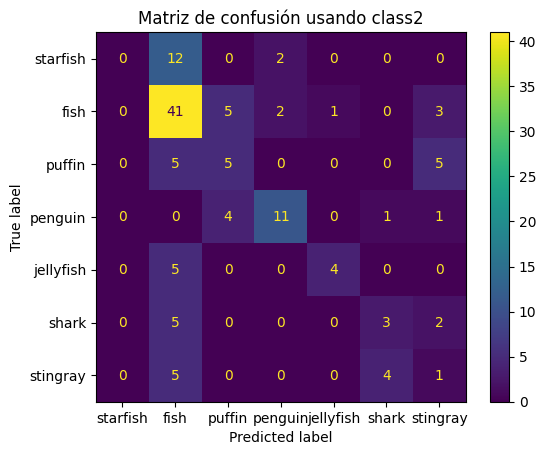

Usando la etiqueta: class3
Epoch 1/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 649ms/step - accuracy: 0.2904 - loss: 1.8750 - val_accuracy: 0.3622 - val_loss: 1.8240
Epoch 2/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 598ms/step - accuracy: 0.2958 - loss: 1.7972 - val_accuracy: 0.3543 - val_loss: 1.7989
Epoch 3/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 568ms/step - accuracy: 0.3238 - loss: 1.7524 - val_accuracy: 0.3071 - val_loss: 1.7646
Epoch 4/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 535ms/step - accuracy: 0.3304 - loss: 1.7037 - val_accuracy: 0.3150 - val_loss: 1.7320
Epoch 5/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 552ms/step - accuracy: 0.3657 - loss: 1.6531 - val_accuracy: 0.3622 - val_loss: 1.6965
Epoch 6/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 553ms/step - accuracy: 0.3838 - loss: 1.6011 - val_accuracy: 0.3543 - val_loss: 1.6655
Epoch 7/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 535ms/step - accuracy: 0.4178 - loss: 1.5540 - val_accuracy: 0.3465 - val_loss: 1.6350
Epoch 8/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 535ms/step - accuracy: 0.4268 - loss: 1.5122 - val_a

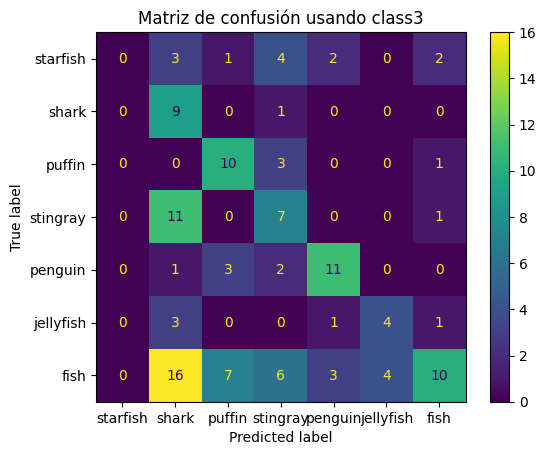

Usando la etiqueta: class4
Epoch 1/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 651ms/step - accuracy: 0.3557 - loss: 1.8799 - val_accuracy: 0.3701 - val_loss: 1.8061
Epoch 2/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 570ms/step - accuracy: 0.3931 - loss: 1.7636 - val_accuracy: 0.3701 - val_loss: 1.7800
Epoch 3/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 567ms/step - accuracy: 0.3931 - loss: 1.7336 - val_accuracy: 0.3701 - val_loss: 1.7562
Epoch 4/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 535ms/step - accuracy: 0.3931 - loss: 1.7047 - val_accuracy: 0.3701 - val_loss: 1.7255
Epoch 5/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 534ms/step - accuracy: 0.3931 - loss: 1.6679 - val_accuracy: 0.3701 - val_loss: 1.6880
Epoch 6/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 536ms/step - accuracy: 0.3931 - loss: 1.6247 - val_accuracy: 0.3622 - val_loss: 1.6465
Epoch 7/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 548ms/step - accuracy: 0.3919 - loss: 1.5792 - val_accuracy: 0.4016 - val_loss: 1.6011
Epoch 8/25
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 536ms/step - accuracy: 0.4221 - loss: 1.5299 - val_a

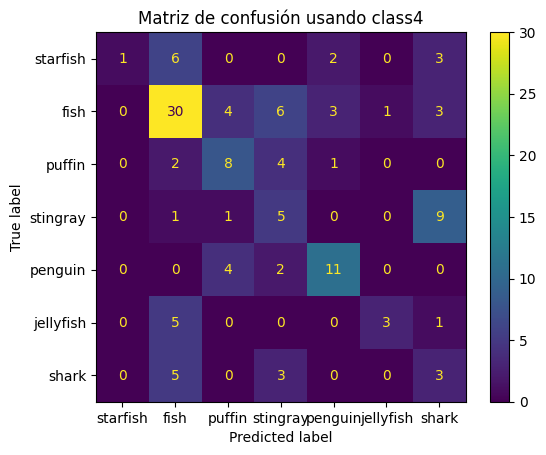

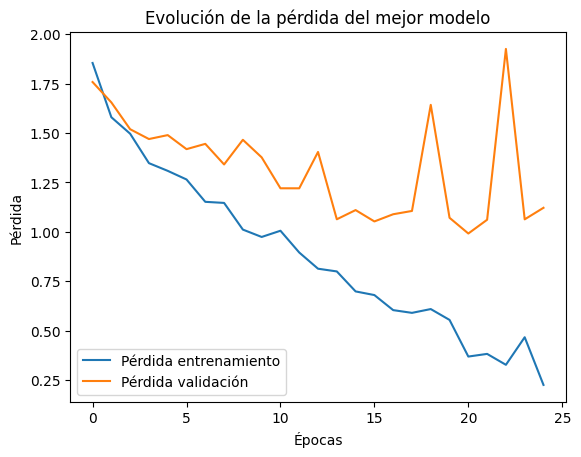

In [ ]:
# Lista de columnas de clase
class_columns = ['class1', 'class2', 'class3', 'class4']

# Definir diferentes configuraciones de la red neuronal
configurations = [
    {'kernel_sizes': [(3, 3), (3, 3), (3, 3)], 'pool_sizes': [(2, 2), (2, 2), (2, 2)], 'learning_rate': 0.001},
    {'kernel_sizes': [(5, 5), (3, 3), (3, 3)], 'pool_sizes': [(3, 3), (2, 2), (2, 2)], 'learning_rate': 0.0005},
    {'kernel_sizes': [(3, 3), (5, 5), (3, 3)], 'pool_sizes': [(2, 2), (3, 3), (2, 2)], 'learning_rate': 0.0001}
]

best_model = None
best_accuracy = 0
best_history = None

for config in configurations:
    print(f"Evaluando configuración: {config}")

    for class_col in class_columns:
        print(f"Usando la etiqueta: {class_col}")

        df_train['new_label'] = df_train[class_col]
        unique_classes = df_train['new_label'].unique()[:7]
        class_mapping = {label: idx for idx, label in enumerate(unique_classes)}

        df_train = df_train[df_train['new_label'].isin(unique_classes)]
        df_train['new_label'] = df_train['new_label'].map(class_mapping)
        num_classes = len(unique_classes)

        dataset = tf.data.Dataset.from_tensor_slices((
            np.stack(df_train['imagen'].apply(lambda img: np.array(img.resize((64, 64))) / 255.0).values),
            keras.utils.to_categorical(df_train['new_label'], num_classes=num_classes)
        )).batch(64).prefetch(tf.data.AUTOTUNE)

        df_valid['new_label'] = df_valid[class_col]
        df_valid['new_label'] = df_valid['new_label'].map(class_mapping)
        df_valid = df_valid.dropna(subset=['new_label'])
        df_valid['new_label'] = df_valid['new_label'].astype(int)

        dataset_valid = tf.data.Dataset.from_tensor_slices((
            np.stack(df_valid['imagen'].apply(lambda img: np.array(img.resize((64, 64))) / 255.0).values),
            keras.utils.to_categorical(df_valid['new_label'], num_classes=num_classes)
        )).batch(64).prefetch(tf.data.AUTOTUNE)

        # Definir la arquitectura de la red
        model = keras.Sequential()
        model.add(layers.Input(shape=(64, 64, 3)))
        for i in range(3):
            model.add(layers.Conv2D(32 * (i + 1), config['kernel_sizes'][i], activation='relu', padding='same'))
            model.add(layers.MaxPooling2D(config['pool_sizes'][i]))
        model.add(layers.Flatten())
        model.add(layers.Dense(128, activation='relu'))
        model.add(layers.Dense(num_classes, activation='softmax'))

        model.compile(optimizer=keras.optimizers.RMSprop(learning_rate=config['learning_rate']),
                      loss='categorical_crossentropy',
                      metrics=['accuracy'])

        history = model.fit(dataset, epochs=25, validation_data=dataset_valid)

        # Evaluar el modelo
        val_accuracy = max(history.history['val_accuracy'])
        if val_accuracy > best_accuracy:
            best_accuracy = val_accuracy
            best_model = model
            best_history = history

        # Matriz de confusión
        y_pred = np.argmax(model.predict(np.stack(df_valid['imagen'].apply(lambda img: np.array(img.resize((64, 64))) / 255.0).values)), axis=1)
        y_true = df_valid['new_label']
        cm = confusion_matrix(y_true, y_pred)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=list(class_mapping.keys()))
        disp.plot()
        plt.title(f"Matriz de confusión usando {class_col}")
        plt.show()

# Graficar la pérdida en función de las épocas para el mejor modelo
plt.plot(best_history.history['loss'], label='Pérdida entrenamiento')
plt.plot(best_history.history['val_loss'], label='Pérdida validación')
plt.xlabel('Épocas')
plt.ylabel('Pérdida')
plt.legend()
plt.title('Evolución de la pérdida del mejor modelo')
plt.show()


Como se puede ver, se han probado 3 configuraciones distintas para los tamaños de kernel, tamaños de pooling y tasa de aprendizaje:

*   Configuración 1: `{'kernel_sizes': [(3, 3), (3, 3), (3, 3)], 'pool_sizes': [(2, 2), (2, 2), (2, 2)], 'learning_rate': 0.001}`
*   Configuración 2: `{'kernel_sizes': [(5, 5), (3, 3), (3, 3)], 'pool_sizes': [(3, 3), (2, 2), (2, 2)], 'learning_rate': 0.0005}`
*   Configuración 3: `{'kernel_sizes': [(3, 3), (5, 5), (3, 3)], 'pool_sizes': [(2, 2), (3, 3), (2, 2)], 'learning_rate': 0.0001}`

Basándonos en accuracy, pérdida (loss) y validación (val_accuracy, val_loss), la Configuración 1 es la mejor opción:

*  Accuracy de entrenamiento más alta en todas las clases (excepto en CLASS3).
*  Mayor val_accuracy en promedio, con CLASS4 alcanzando 0.7087, la más alta de todas.
*  Pérdida de validación (val_loss) más baja en comparación con las otras configuraciones.
*  Menor overfitting comparado con Configuración 3.

La configuración 1 es la mejor en general, ya que logra alta precisión sin perder demasiada capacidad de generalización.

Si analizamos la accuracy y val_accuracy de cada clase dentro de Configuración 1, vemos que la mejor etiqueta es class 1.

*  Accuracy = 0.9183 (la más alta de todas las clases y configuraciones).

*  Val_accuracy = 0.6535, que sigue siendo bastante alta comparada con otras.

*  Loss y val_loss razonables, lo que indica un buen equilibrio entre aprendizaje y generalización.




También se puede apreciar que el mejor modelo comienza a sobreentrenar a partir de la época 15, por que lo que se reestablecerá el número de épocas a dicho valor.

Probemos ahora con los datos reetiquetados y tras haber hecho el proceso de aumentación de datos. Vamos aa empezar probando únicamente con la configuración 1 usando la class1.

In [17]:
df_train_balanced

,filename,width,height,class,xmin,ymin,xmax,ymax,imagen,area,count,score1,class1,score2,class2,score3,class3,score4,class4
0,IMG_3147_jpeg_jpg.rf.fc4622004ff72e58b54663577...,768,1024,puffin,91,392,571,823,<PIL.Image.Image image mode=RGB size=64x64 at ...,206880,3,1655040,puffin,1655040,puffin,206880,puffin,620640,puffin
1,IMG_3148_jpeg_jpg.rf.daef4a62da020f684a31336a1...,768,1024,puffin,0,205,767,860,<PIL.JpegImagePlugin.JpegImageFile image mode=...,502385,3,4019080,puffin,4019080,puffin,502385,puffin,1507155,puffin
2,IMG_2584_jpeg_jpg.rf.fdf498ef5b1b000a6c51d15dc...,768,1024,stingray,0,768,71,875,<PIL.Image.Image image mode=RGB size=64x64 at ...,7597,4,121552,fish,489600,fish,18564,stingray,30388,stingray
3,IMG_2335_jpeg_jpg.rf.fee7aabbe3a95b58fa737bf45...,768,1024,penguin,225,422,295,529,<PIL.Image.Image image mode=RGB size=64x64 at ...,7490,12,30679040,penguin,30679040,penguin,7490,penguin,89880,penguin
4,IMG_2541_jpeg_jpg.rf.fc997b87790e715d47ce1cc83...,768,1024,starfish,302,410,534,730,<PIL.Image.Image image mode=RGB size=64x64 at ...,74240,1,148480,starfish,148480,starfish,74240,starfish,74240,starfish
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,IMG_2541_jpeg_jpg.rf.fc997b87790e715d47ce1cc83...,768,1024,starfish,302,410,534,730,<PIL.Image.Image image mode=RGB size=64x64 at ...,74240,1,148480,starfish,148480,starfish,74240,starfish,74240,starfish
1096,IMG_2541_jpeg_jpg.rf.fc997b87790e715d47ce1cc83...,768,1024,starfish,302,410,534,730,<PIL.Image.Image image mode=RGB size=64x64 at ...,74240,1,148480,starfish,148480,starfish,74240,starfish,74240,starfish
1097,IMG_3147_jpeg_jpg.rf.fc4622004ff72e58b54663577...,768,1024,puffin,91,392,571,823,<PIL.Image.Image image mode=RGB size=64x64 at ...,206880,3,1655040,puffin,1655040,puffin,206880,puffin,620640,puffin
1098,IMG_8496_MOV-5_jpg.rf.eacca955182a03a262de9b2c...,576,1024,fish,0,466,134,642,<PIL.JpegImagePlugin.JpegImageFile image mode=...,23584,3,188672,fish,188672,fish,43188,fish,70752,fish


Evaluando configuración: {'kernel_sizes': [(3, 3), (3, 3), (3, 3)], 'pool_sizes': [(2, 2), (2, 2), (2, 2)], 'learning_rate': 0.001}
Usando la etiqueta: class1
Epoch 1/15
18/18 ━━━━━━━━━━━━━━━━━━━━ 11s 515ms/step - accuracy: 0.3304 - loss: 1.6924 - val_accuracy: 0.3758 - val_loss: 1.6462
Epoch 2/15
18/18 ━━━━━━━━━━━━━━━━━━━━ 9s 486ms/step - accuracy: 0.6954 - loss: 0.9833 - val_accuracy: 0.5364 - val_loss: 1.4313
Epoch 3/15
18/18 ━━━━━━━━━━━━━━━━━━━━ 11s 603ms/step - accuracy: 0.7851 - loss: 0.6991 - val_accuracy: 0.5606 - val_loss: 1.6144
Epoch 4/15
18/18 ━━━━━━━━━━━━━━━━━━━━ 10s 540ms/step - accuracy: 0.7799 - loss: 0.6687 - val_accuracy: 0.6000 - val_loss: 1.3739
Epoch 5/15
18/18 ━━━━━━━━━━━━━━━━━━━━ 8s 463ms/step - accuracy: 0.7972 - loss: 0.6332 - val_accuracy: 0.5758 - val_loss: 1.3138
Epoch 6/15
18/18 ━━━━━━━━━━━━━━━━━━━━ 10s 546ms/step - accuracy: 0.8445 - loss: 0.4953 - val_accuracy: 0.6000 - val_loss: 1.3757
Epoch 7/15
18/18 ━━━━━━━━━━━━━━━━━━━━ 10s 542ms/step - accuracy: 0.81

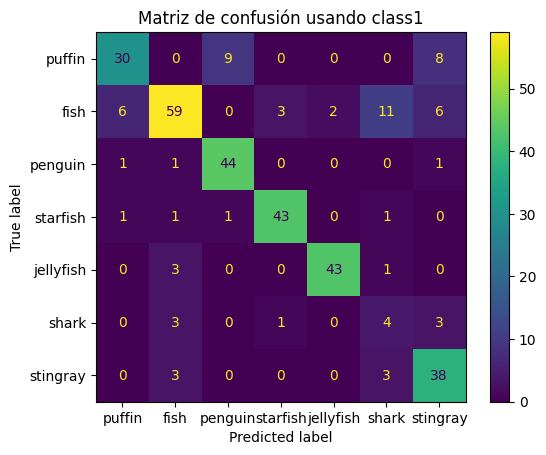

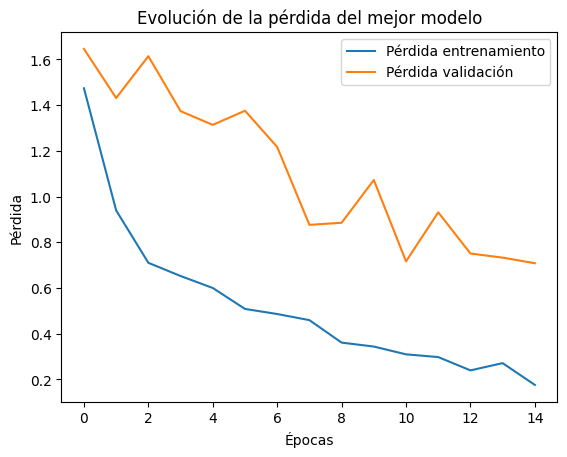

In [32]:
# Lista de columnas de clase
class_columns = ['class1']

# Definir diferentes configuraciones de la red neuronal
configurations = [
    {'kernel_sizes': [(3, 3), (3, 3), (3, 3)], 'pool_sizes': [(2, 2), (2, 2), (2, 2)], 'learning_rate': 0.001},
]

best_model = None
best_accuracy = 0
best_history = None

for config in configurations:
    print(f"Evaluando configuración: {config}")

    for class_col in class_columns:
        print(f"Usando la etiqueta: {class_col}")

        df_train_balanced['new_label'] = df_train_balanced[class_col]
        unique_classes = df_train_balanced['new_label'].unique()[:7]
        class_mapping = {label: idx for idx, label in enumerate(unique_classes)}

        df_train_balanced = df_train_balanced[df_train_balanced['new_label'].isin(unique_classes)]
        df_train_balanced['new_label'] = df_train_balanced['new_label'].map(class_mapping)
        num_classes = len(unique_classes)

        # Corregir el redimensionamiento de la imagen con copia explícita
        def resize_image(img):
            img_copy = img.copy()  # Copia explícita del objeto PIL.Image
            img_resized = img_copy.resize((64, 64))
            img_array = np.array(img_resized) / 255.0
            return img_array

        dataset = tf.data.Dataset.from_tensor_slices((
            np.stack(df_train_balanced['imagen'].apply(resize_image).values),
            keras.utils.to_categorical(df_train_balanced['new_label'], num_classes=num_classes)
        )).batch(64).prefetch(tf.data.AUTOTUNE)

        df_valid_balanced['new_label'] = df_valid_balanced[class_col]
        df_valid_balanced['new_label'] = df_valid_balanced['new_label'].map(class_mapping)
        df_valid_balanced = df_valid_balanced.dropna(subset=['new_label'])
        df_valid_balanced['new_label'] = df_valid_balanced['new_label'].astype(int)

        dataset_valid = tf.data.Dataset.from_tensor_slices((
            np.stack(df_valid_balanced['imagen'].apply(resize_image).values),
            keras.utils.to_categorical(df_valid_balanced['new_label'], num_classes=num_classes)
        )).batch(64).prefetch(tf.data.AUTOTUNE)

        # Definir la arquitectura de la red
        model = keras.Sequential()
        model.add(layers.Input(shape=(64, 64, 3)))
        for i in range(3):
            model.add(layers.Conv2D(32 * (i + 1), config['kernel_sizes'][i], activation='relu', padding='same'))
            model.add(layers.MaxPooling2D(config['pool_sizes'][i]))
        model.add(layers.Flatten())
        model.add(layers.Dense(128, activation='relu'))
        model.add(layers.Dense(num_classes, activation='softmax'))

        model.compile(optimizer=keras.optimizers.RMSprop(learning_rate=config['learning_rate']),
                      loss='categorical_crossentropy',
                      metrics=['accuracy'])

        history = model.fit(dataset, epochs=15, validation_data=dataset_valid)

        # Evaluar el modelo
        val_accuracy = max(history.history['val_accuracy'])
        if val_accuracy > best_accuracy:
            best_accuracy = val_accuracy
            best_model = model
            best_history = history

        # Matriz de confusión
        y_pred = np.argmax(model.predict(np.stack(df_valid_balanced['imagen'].apply(resize_image).values)), axis=1)
        y_true = df_valid_balanced['new_label']
        cm = confusion_matrix(y_true, y_pred)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=list(class_mapping.keys()))
        disp.plot()
        plt.title(f"Matriz de confusión usando {class_col}")
        plt.show()

# Graficar la pérdida en función de las épocas para el mejor modelo
plt.plot(best_history.history['loss'], label='Pérdida entrenamiento')
plt.plot(best_history.history['val_loss'], label='Pérdida validación')
plt.xlabel('Épocas')
plt.ylabel('Pérdida')
plt.legend()
plt.title('Evolución de la pérdida del mejor modelo')
plt.show()

19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step


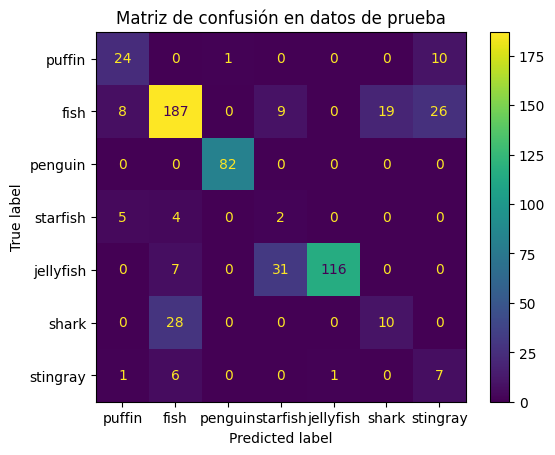

Accuracy en datos de prueba: 0.7328767123287672


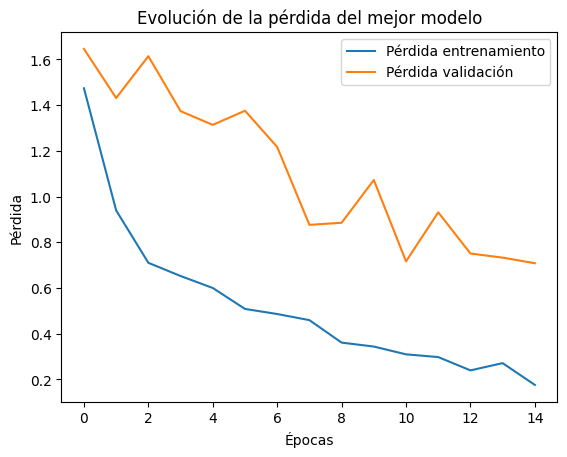

In [33]:
from sklearn.metrics import accuracy_score
# Preprocesar df_test
df_test['new_label'] = df_test['class']  # Usar la primera columna de clase
df_test['new_label'] = df_test['new_label'].map(class_mapping)
df_test = df_test.dropna(subset=['new_label'])
df_test['new_label'] = df_test['new_label'].astype(int)

# Crear el dataset de prueba
dataset_test = tf.data.Dataset.from_tensor_slices((
    np.stack(df_test['imagen'].apply(resize_image).values),
    keras.utils.to_categorical(df_test['new_label'], num_classes=num_classes)
)).batch(64).prefetch(tf.data.AUTOTUNE)

# Evaluar el modelo en el dataset de prueba
y_pred_test = np.argmax(best_model.predict(np.stack(df_test['imagen'].apply(resize_image).values)), axis=1)
y_true_test = df_test['new_label']
cm_test = confusion_matrix(y_true_test, y_pred_test)
disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=list(class_mapping.keys()))
disp_test.plot()
plt.title(f"Matriz de confusión en datos de prueba")
plt.show()
# Calcular el accuracy
accuracy_test = accuracy_score(y_true_test, y_pred_test)
print(f"Accuracy en datos de prueba: {accuracy_test}")
# Graficar la pérdida en función de las épocas para el mejor modelo
plt.plot(best_history.history['loss'], label='Pérdida entrenamiento')
plt.plot(best_history.history['val_loss'], label='Pérdida validación')
plt.xlabel('Épocas')
plt.ylabel('Pérdida')
plt.legend()
plt.title('Evolución de la pérdida del mejor modelo')
plt.show()

Vamos a probar el modelo entrenado con los datos reetiquetados `class1` en los datos de test:

Entrenando modelo con Configuración 1: {'kernel_sizes': [(3, 3), (3, 3), (3, 3)], 'pool_sizes': [(2, 2), (2, 2), (2, 2)], 'learning_rate': 0.001}
Epoch 1/15
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 483ms/step - accuracy: 0.2662 - loss: 1.9958
Epoch 2/15
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 484ms/step - accuracy: 0.4451 - loss: 1.7383
Epoch 3/15
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 434ms/step - accuracy: 0.4413 - loss: 1.6529
Epoch 4/15
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 450ms/step - accuracy: 0.4015 - loss: 1.5109
Epoch 5/15
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 450ms/step - accuracy: 0.4568 - loss: 1.4546
Epoch 6/15
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 433ms/step - accuracy: 0.5188 - loss: 1.3435
Epoch 7/15
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 417ms/step - accuracy: 0.5354 - loss: 1.2881
Epoch 8/15
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 433ms/step - accuracy: 0.5259 - loss: 1.2876
Epoch 9/15
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 417ms/step - accuracy: 0.5619 - loss: 1.2142
Epoch 10/15
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 418ms/step - accuracy: 0.5654 - loss: 1.2030
Epoch 11/15
7

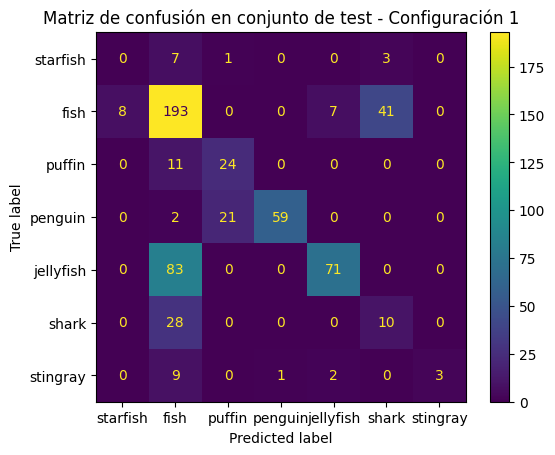

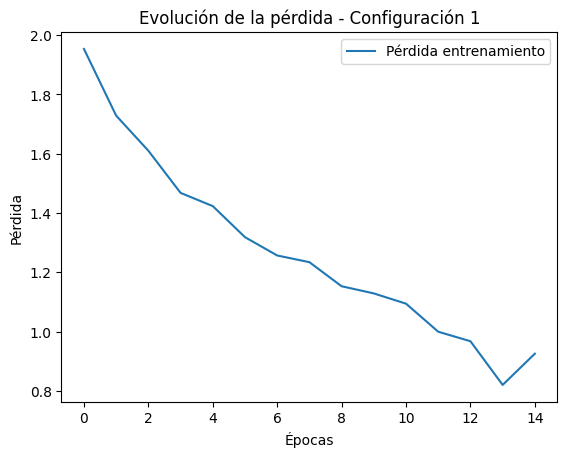

Entrenando modelo con Configuración 2: {'kernel_sizes': [(5, 5), (3, 3), (3, 3)], 'pool_sizes': [(3, 3), (2, 2), (2, 2)], 'learning_rate': 0.0005}
Epoch 1/15
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 383ms/step - accuracy: 0.3222 - loss: 1.8943
Epoch 2/15
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 350ms/step - accuracy: 0.4451 - loss: 1.6939
Epoch 3/15
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 333ms/step - accuracy: 0.4451 - loss: 1.6400
Epoch 4/15
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 318ms/step - accuracy: 0.4437 - loss: 1.5259
Epoch 5/15
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 315ms/step - accuracy: 0.4350 - loss: 1.4609
Epoch 6/15
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 319ms/step - accuracy: 0.5057 - loss: 1.3864
Epoch 7/15
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 316ms/step - accuracy: 0.5432 - loss: 1.3235
Epoch 8/15
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 350ms/step - accuracy: 0.5483 - loss: 1.2823
Epoch 9/15
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 317ms/step - accuracy: 0.5455 - loss: 1.2268
Epoch 10/15
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 299ms/step - accuracy: 0.5698 - loss: 1.2124
Epoch 11/15


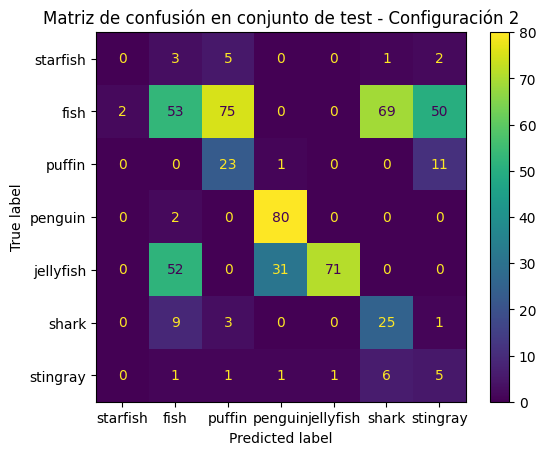

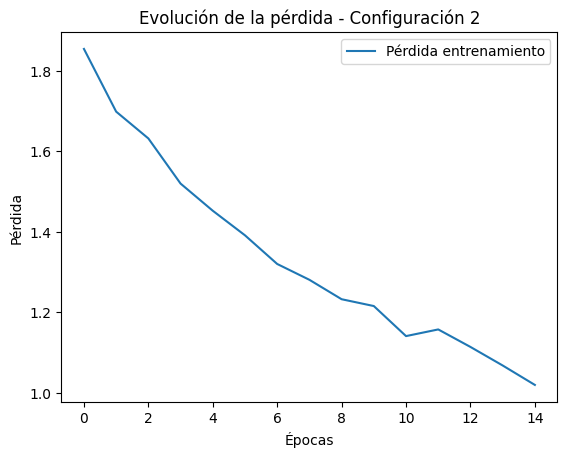

Entrenando modelo con Configuración 3: {'kernel_sizes': [(3, 3), (5, 5), (3, 3)], 'pool_sizes': [(2, 2), (3, 3), (2, 2)], 'learning_rate': 0.0001}
Epoch 1/15
7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 534ms/step - accuracy: 0.3650 - loss: 1.8972
Epoch 2/15
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 500ms/step - accuracy: 0.4451 - loss: 1.7280
Epoch 3/15
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 485ms/step - accuracy: 0.4451 - loss: 1.6855
Epoch 4/15
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 484ms/step - accuracy: 0.4451 - loss: 1.6603
Epoch 5/15
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 482ms/step - accuracy: 0.4451 - loss: 1.6335
Epoch 6/15
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 468ms/step - accuracy: 0.4451 - loss: 1.6014
Epoch 7/15
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 501ms/step - accuracy: 0.4451 - loss: 1.5651
Epoch 8/15
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 467ms/step - accuracy: 0.4469 - loss: 1.5261
Epoch 9/15
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 468ms/step - accuracy: 0.4626 - loss: 1.4846
Epoch 10/15
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 483ms/step - accuracy: 0.4739 - loss: 1.4440
Epoch 11/15


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


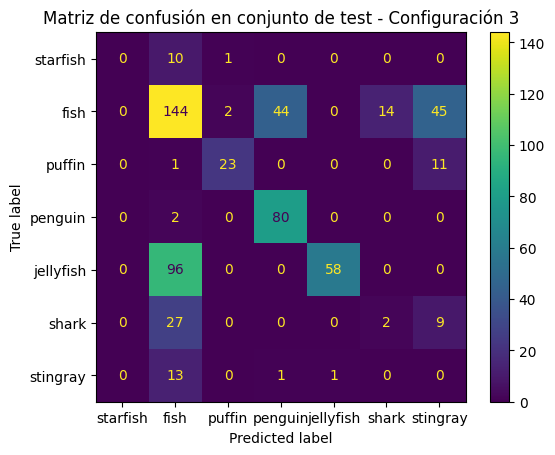

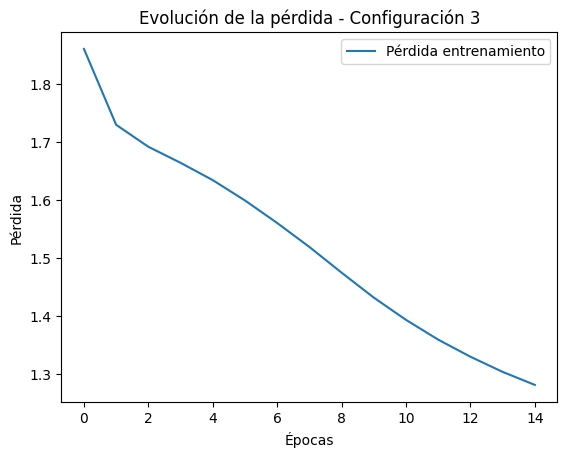

In [ ]:
from sklearn.metrics import classification_report

# Definir configuraciones de la red neuronal
configurations = [
    {'kernel_sizes': [(3, 3), (3, 3), (3, 3)], 'pool_sizes': [(2, 2), (2, 2), (2, 2)], 'learning_rate': 0.001},
    {'kernel_sizes': [(5, 5), (3, 3), (3, 3)], 'pool_sizes': [(3, 3), (2, 2), (2, 2)], 'learning_rate': 0.0005},
    {'kernel_sizes': [(3, 3), (5, 5), (3, 3)], 'pool_sizes': [(2, 2), (3, 3), (2, 2)], 'learning_rate': 0.0001}
]

# Usar solo Clase 1
df_train['new_label'] = df_train['class1']
unique_classes = df_train['new_label'].unique()[:7]
class_mapping = {label: idx for idx, label in enumerate(unique_classes)}

df_train = df_train[df_train['new_label'].isin(unique_classes)]
df_train['new_label'] = df_train['new_label'].map(class_mapping)
num_classes = len(unique_classes)

# Crear dataset de entrenamiento
dataset = tf.data.Dataset.from_tensor_slices((
    np.stack(df_train['imagen'].apply(lambda img: np.array(img.resize((64, 64))) / 255.0).values),
    keras.utils.to_categorical(df_train['new_label'], num_classes=num_classes)
)).batch(64).prefetch(tf.data.AUTOTUNE)

# Crear dataset de prueba
df_test['new_label'] = df_test['class']
df_test['new_label'] = df_test['new_label'].map(class_mapping)
df_test = df_test.dropna(subset=['new_label'])
df_test['new_label'] = df_test['new_label'].astype(int)

dataset_test = tf.data.Dataset.from_tensor_slices((
    np.stack(df_test['imagen'].apply(lambda img: np.array(img.resize((64, 64))) / 255.0).values),
    keras.utils.to_categorical(df_test['new_label'], num_classes=num_classes)
)).batch(64).prefetch(tf.data.AUTOTUNE)

# Entrenar y evaluar cada configuración
for i, config in enumerate(configurations):
    print(f"Entrenando modelo con Configuración {i+1}: {config}")

    # Definir la arquitectura de la red
    model = keras.Sequential()
    model.add(layers.Input(shape=(64, 64, 3)))
    for j in range(3):
        model.add(layers.Conv2D(32 * (j + 1), config['kernel_sizes'][j], activation='relu', padding='same'))
        model.add(layers.MaxPooling2D(config['pool_sizes'][j]))
    model.add(layers.Flatten())
    model.add(layers.Dense(128, activation='relu'))
    model.add(layers.Dense(num_classes, activation='softmax'))

    model.compile(optimizer=keras.optimizers.RMSprop(learning_rate=config['learning_rate']),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    # Entrenar el modelo
    history = model.fit(dataset, epochs=15)

    # Evaluar en test
    y_pred = np.argmax(model.predict(np.stack(df_test['imagen'].apply(lambda img: np.array(img.resize((64, 64))) / 255.0).values)), axis=1)
    y_true = df_test['new_label']

    # Calcular métricas
    print(f"Reporte de Clasificación para Configuración {i+1}:")
    print(classification_report(y_true, y_pred, target_names=list(class_mapping.keys())))

    # Matriz de confusión
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=list(class_mapping.keys()))
    disp.plot()
    plt.title(f"Matriz de confusión en conjunto de test - Configuración {i+1}")
    plt.show()

    # Graficar la pérdida en función de las épocas
    plt.plot(history.history['loss'], label='Pérdida entrenamiento')
    plt.xlabel('Épocas')
    plt.ylabel('Pérdida')
    plt.legend()
    plt.title(f'Evolución de la pérdida - Configuración {i+1}')
    plt.show()


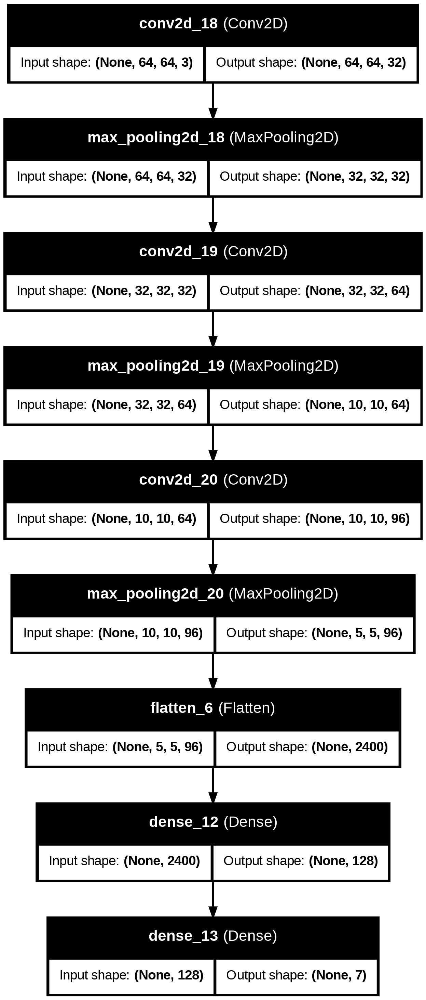

In [ ]:
# Visualizar la arquitectura de la red seleccionada
!pip install pydot
keras.utils.plot_model(model, show_shapes=True, show_layer_names=True)

La Configuración 1 es la mejor, con 62% de accuracy y el mayor F1-score ponderado (0.62), logrando un buen balance entre precisión y recall. Destaca en clases como penguin (F1-score 0.83) y jellyfish (0.61), pero falla en starfish y stingray (recall 0.00 y 0.20, respectivamente). Para mejorar, se podría aumentar datos de clases minoritarias.
Se pueden mejorar los modelos utilizando varias estrategias:

1. Aumentar la cantidad y diversidad de datos:
Dado que el dataset es limitado, el modelo no aprende correctamente la variabilidad de las clases. Si se tuviera más capacidad de computación, se podría aplicar aumento de datos (data augmentation) con rotaciones, cambios de iluminación y escalados para que el modelo generalice mejor.

2. Balancear las clases:
Algunas clases tienen pocos ejemplos en comparación con otras (por ejemplo, starfish (11) vs fish (249)). Esto provoca que el modelo tenga un sesgo hacia las clases más habituales en la base de datos. Técnicas como oversampling (duplicar muestras de clases minoritarias) o undersampling (reducir muestras de clases dominantes) podrían ayudar a equilibrar las predicciones.

3. Ajustar la arquitectura de la red:
Se puede probar con más filtros en las capas convolucionales, agregar capas de dropout para evitar el sobreajuste y experimentar con capas batch normalization para estabilizar el aprendizaje, entre otras cosas.

4. Optimizar los hiperparámetros:
Variar la tasa de aprendizaje: Un learning rate dinámico que disminuya con las épocas podría mejorar la convergencia del modelo.
